# Telecom Churn Case Study

### Objective

The business objective is to predict the churn in the last (i.e. the ninth) month using the data (features) from the first three months. 

Hence, build models to predict churn. The predictive model that you’re going to build will serve two purposes:

- It will be used to predict whether a high-value customer will churn or not, in near future (i.e. churn phase). By knowing this, the company can take action steps such as providing special plans, discounts on recharge etc.

- It will be used to identify important variables that are strong predictors of churn. These variables may also indicate why customers choose to switch to other networks.

### Importing necessary modules

In [1]:
# Import modules.

import pandas as pd
import numpy as np
import datetime as dt

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import plot_tree
import plotly.express as ex

from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.metrics import plot_roc_curve
from sklearn.decomposition import PCA
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import IncrementalPCA

from sklearn.metrics import r2_score

import warnings
warnings.filterwarnings('ignore')

## Step 1: Data Understanding and Data Cleaning

In [2]:
#Importing the telecom CSV file.

telecom = pd.read_csv("./telecom_churn_data.csv")

In [3]:
pd.options.display.max_rows = None
pd.options.display.max_columns = None

In [4]:
# Exploring the telecom dataframe values.

telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [5]:
# Checking the Dataframe Shape

telecom.shape

(99999, 226)

In [6]:
# Checking the data structure present in the dataframe.

telecom.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
 #   Column                    Dtype  
---  ------                    -----  
 0   mobile_number             int64  
 1   circle_id                 int64  
 2   loc_og_t2o_mou            float64
 3   std_og_t2o_mou            float64
 4   loc_ic_t2o_mou            float64
 5   last_date_of_month_6      object 
 6   last_date_of_month_7      object 
 7   last_date_of_month_8      object 
 8   last_date_of_month_9      object 
 9   arpu_6                    float64
 10  arpu_7                    float64
 11  arpu_8                    float64
 12  arpu_9                    float64
 13  onnet_mou_6               float64
 14  onnet_mou_7               float64
 15  onnet_mou_8               float64
 16  onnet_mou_9               float64
 17  offnet_mou_6              float64
 18  offnet_mou_7              float64
 19  offnet_mou_8              float64
 20  offnet_mou_9              f

In [7]:
#Exploring the statistical values of the all the columns in the dataframe.

telecom.describe(include="all")

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999,99398,98899,98340,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000

#### Exploring the categorical and numerical variables in the dataset

In [8]:
# Created the function to identify column data type, Null Values, Missing values and unique count.

def basic_details(data):
    table_detail=pd.DataFrame(data.dtypes).T.rename(index={0:'column type'})
    table_detail= table_detail.append(pd.DataFrame(data.isnull().sum()).T.rename(index={0:'Null Values'}))
    table_detail= table_detail.append(round(pd.DataFrame(data.isnull().sum()/len(data)*100),2).T.rename(index={0:'Missing Values%'}))
    table_detail= table_detail.append(pd.DataFrame(data.nunique()).T.rename(index={0:'Unique Count'}))
    display(table_detail)

In [9]:
# Function call

basic_details(telecom)

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
column type,int64,int64,float64,float64,float64,object,object,object,object,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,fl

### Missing Value treatment

**"missingno"** provides a small toolset of flexible and easy-to-use missing data visualizations and utilities that allows you to get a quick visual summary of the completeness (or lack thereof) of your dataset

#### Lets check the Fields with missing values and try to impute appropriate values or drop them if they wont contribute in the modelling

Below features have only 1value in the column hence no value addition in retaining feature
* circle_id
* loc_og_t2o_mou
* std_og_t2o_mou
* loc_ic_t2o_mou
* last_date_of_month_6
* last_date_of_month_7
* last_date_of_month_8
* last_date_of_month_9
* std_og_t2c_mou_6
* std_og_t2c_mou_7
* std_og_t2c_mou_8

In [10]:
#Dropping the variables as mentioned above.

telecom=telecom.drop(['circle_id','loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou','last_date_of_month_6','last_date_of_month_7','last_date_of_month_8','last_date_of_month_9',"std_og_t2c_mou_6","std_og_t2c_mou_7","std_og_t2c_mou_8"],axis=1)

Dropping "rows" containing either 80% or more than 80% NaN Values

In [11]:
# Dropping the rows

perc = 80.0 
min_count =  int(((100-perc)/100)*telecom.shape[1] + 1)
telecom = telecom.dropna( axis=0, 
                    thresh=min_count)

Dropping "columns" having more than 70% or more NaN Values.

In [12]:
# Dropping the insignificant columns

avg_rev=["arpu_3g_6","arpu_3g_7","arpu_3g_8","arpu_3g_9","arpu_2g_6","arpu_2g_7","arpu_2g_8","arpu_2g_9"]

telecom=telecom.drop(avg_rev, axis=1)

Coverting the fields to correct data type and Imputing appropriate values.

In [13]:
# Converting the date values to date type columns.

for var in telecom.select_dtypes(np.object).columns:
    telecom[var]=telecom[var].fillna(0)
    telecom[var]=pd.to_datetime(telecom[var])

In [14]:
# Imputing the missing value with a new field value "-1".

def impute(arr):
    for i in arr:
        telecom[i]=telecom[i].fillna(-1)

scheme=["night_pck_user_6","night_pck_user_7","night_pck_user_8","night_pck_user_9"]

fbusers=["fb_user_6","fb_user_7","fb_user_8","fb_user_9"]

impute(scheme)
impute(fbusers)

In [15]:
# Imputing missing values for recharge columns as "zero".

Recharge=["total_rech_data_6","total_rech_data_7","total_rech_data_8","total_rech_data_9","max_rech_data_6","max_rech_data_7","max_rech_data_8","max_rech_data_9","count_rech_2g_6","count_rech_2g_7","count_rech_2g_8","count_rech_2g_9","count_rech_3g_6","count_rech_3g_7","count_rech_3g_8","count_rech_3g_9","av_rech_amt_data_6","av_rech_amt_data_7","av_rech_amt_data_8","av_rech_amt_data_9"]

for i in Recharge:
    telecom[i]=telecom[i].fillna(0)

#### Outlier Detection

In [16]:
telecom.describe()

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,

We do notice huge difference between, minimum values, average values and the IQR and could say, that the data values appear screwed.

We would have to **Treat the Outliers** for variables where the data is highly screwed.

In [17]:
var=['onnet_mou_6','onnet_mou_7','onnet_mou_8','offnet_mou_6','offnet_mou_7','offnet_mou_8','loc_og_t2t_mou_6','loc_og_t2t_mou_7','loc_og_t2t_mou_8','std_og_t2t_mou_6','std_og_t2t_mou_7','std_og_t2t_mou_8','std_og_mou_6','std_og_mou_7','std_og_mou_8']

telecom.loc[(telecom.onnet_mou_6>telecom.onnet_mou_6.mean()+3*telecom.onnet_mou_6.std()),'onnet_mou_6']=telecom.onnet_mou_6.mean()+3*telecom.onnet_mou_6.std()
telecom.loc[(telecom.onnet_mou_7>telecom.onnet_mou_7.mean()+3*telecom.onnet_mou_7.std()),'onnet_mou_7']=telecom.onnet_mou_7.mean()+3*telecom.onnet_mou_7.std()
telecom.loc[(telecom.onnet_mou_8>telecom.onnet_mou_8.mean()+3*telecom.onnet_mou_8.std()),'onnet_mou_8']=telecom.onnet_mou_8.mean()+3*telecom.onnet_mou_8.std()

telecom.loc[(telecom.offnet_mou_6>telecom.offnet_mou_6.mean()+3*telecom.offnet_mou_6.std()),'offnet_mou_6']=telecom.offnet_mou_6.mean()+3*telecom.offnet_mou_6.std()
telecom.loc[(telecom.offnet_mou_7>telecom.offnet_mou_7.mean()+3*telecom.offnet_mou_7.std()),'offnet_mou_7']=telecom.offnet_mou_7.mean()+3*telecom.offnet_mou_7.std()
telecom.loc[(telecom.offnet_mou_8>telecom.offnet_mou_8.mean()+3*telecom.offnet_mou_8.std()),'offnet_mou_8']=telecom.offnet_mou_8.mean()+3*telecom.offnet_mou_8.std()

telecom.loc[(telecom.loc_og_t2t_mou_6>telecom.loc_og_t2t_mou_6.mean()+3*telecom.loc_og_t2t_mou_6.std()),'loc_og_t2t_mou_6']=telecom.loc_og_t2t_mou_6.mean()+3*telecom.loc_og_t2t_mou_6.std()
telecom.loc[(telecom.loc_og_t2t_mou_7>telecom.loc_og_t2t_mou_7.mean()+3*telecom.loc_og_t2t_mou_7.std()),'loc_og_t2t_mou_7']=telecom.loc_og_t2t_mou_7.mean()+3*telecom.loc_og_t2t_mou_7.std()
telecom.loc[(telecom.loc_og_t2t_mou_8>telecom.loc_og_t2t_mou_8.mean()+3*telecom.loc_og_t2t_mou_8.std()),'loc_og_t2t_mou_8']=telecom.loc_og_t2t_mou_8.mean()+3*telecom.loc_og_t2t_mou_8.std()

telecom.loc[(telecom.std_og_t2t_mou_6>telecom.std_og_t2t_mou_6.mean()+3*telecom.std_og_t2t_mou_6.std()),'std_og_t2t_mou_6']=telecom.std_og_t2t_mou_6.mean()+3*telecom.std_og_t2t_mou_6.std()
telecom.loc[(telecom.std_og_t2t_mou_7>telecom.std_og_t2t_mou_7.mean()+3*telecom.std_og_t2t_mou_7.std()),'std_og_t2t_mou_7']=telecom.std_og_t2t_mou_7.mean()+3*telecom.std_og_t2t_mou_7.std()
telecom.loc[(telecom.std_og_t2t_mou_8>telecom.std_og_t2t_mou_8.mean()+3*telecom.std_og_t2t_mou_8.std()),'std_og_t2t_mou_8']=telecom.std_og_t2t_mou_8.mean()+3*telecom.std_og_t2t_mou_8.std()

telecom.loc[(telecom.std_og_mou_6>telecom.std_og_mou_6.mean()+3*telecom.std_og_mou_6.std()),'std_og_mou_6']=telecom.std_og_mou_6.mean()+3*telecom.std_og_mou_6.std()
telecom.loc[(telecom.std_og_mou_7>telecom.std_og_mou_7.mean()+3*telecom.std_og_mou_7.std()),'std_og_mou_7']=telecom.std_og_mou_7.mean()+3*telecom.std_og_mou_7.std()
telecom.loc[(telecom.std_og_mou_8>telecom.std_og_mou_8.mean()+3*telecom.std_og_mou_8.std()),'std_og_mou_8']=telecom.std_og_mou_8.mean()+3*telecom.std_og_mou_8.std()


In [18]:
# Imputing other variables with the median ( as most of the columns have screwed data)

telecom.fillna(telecom.median(), inplace=True)

In [19]:
# Checking the null values after Data cleaning process.

telecom.isnull().mean()*100

mobile_number               0.0
arpu_6                      0.0
arpu_7                      0.0
arpu_8                      0.0
arpu_9                      0.0
onnet_mou_6                 0.0
onnet_mou_7                 0.0
onnet_mou_8                 0.0
onnet_mou_9                 0.0
offnet_mou_6                0.0
offnet_mou_7                0.0
offnet_mou_8                0.0
offnet_mou_9                0.0
roam_ic_mou_6               0.0
roam_ic_mou_7               0.0
roam_ic_mou_8               0.0
roam_ic_mou_9               0.0
roam_og_mou_6               0.0
roam_og_mou_7               0.0
roam_og_mou_8               0.0
roam_og_mou_9               0.0
loc_og_t2t_mou_6            0.0
loc_og_t2t_mou_7            0.0
loc_og_t2t_mou_8            0.0
loc_og_t2t_mou_9            0.0
loc_og_t2m_mou_6            0.0
loc_og_t2m_mou_7            0.0
loc_og_t2m_mou_8            0.0
loc_og_t2m_mou_9            0.0
loc_og_t2f_mou_6            0.0
loc_og_t2f_mou_7            0.0
loc_og_t

# Step 2: Data Preparation

#### Deriving new metrics from the existing columns.

In [20]:
telecom["Total_mou"]= telecom["total_ic_mou_9"]+telecom["total_og_mou_9"]
telecom["Total_data_usage"]=telecom["vol_2g_mb_9"]+telecom["vol_3g_mb_9"]
telecom["Target"]=((telecom["Total_mou"] == 0.0) & (telecom["Total_data_usage"]==0.0)).astype("int")

#### Calculate "Churn Rate"

In [21]:
telecom["Target"].value_counts(1)

0    0.898089
1    0.101911
Name: Target, dtype: float64

The Chrun Rate appears to be around 10.2 %.

Since the data seem to be highly imbalanced hence we would need to introduce the class imbalance during the modelling.

#### Columns from 9th Month - "September" is no longer needed now, So we will drop all the columns for month - 9.

In [22]:
columns9=[]
for i in telecom.columns:
    if i.endswith("9") or ("sep" in i):
        columns9.append(i)

In [23]:
telecom=telecom.drop(columns9, axis=1)

In [24]:
telecom.shape

(99999, 158)

#### Lets derive new metrics by calculating the difference in usage between 6th - 7th month and 8th Month.
This would help us draw a pattern about users who are about to churn. 

In [25]:
telecom['arpu_diff'] = telecom.arpu_8 - ((telecom.arpu_6 + telecom.arpu_7)/2)
telecom["vbc_diff"] = telecom.aug_vbc_3g - ((telecom.jul_vbc_3g + telecom.jun_vbc_3g)/2)
telecom['total_og_mou_diff'] = telecom.total_og_mou_8 - ((telecom.total_og_mou_6 + telecom.total_og_mou_7)/2)
telecom['total_rech_data_diff'] =telecom.total_rech_data_8 - ((telecom.total_rech_data_6 + telecom.total_rech_data_7)/2)

telecom['max_rech_data_diff'] = telecom.max_rech_data_8 - ((telecom.max_rech_data_6 + telecom.max_rech_data_7)/2)
telecom['vol_2g_mb_diff'] = telecom.vol_2g_mb_8 - ((telecom.vol_2g_mb_6 + telecom.vol_2g_mb_7)/2)

telecom['vol_3g_mb_diff'] = telecom.vol_3g_mb_8 - ((telecom.vol_3g_mb_6 + telecom.vol_3g_mb_7)/2)
telecom['fb_user_diff']=telecom.fb_user_8 - ((telecom.fb_user_6 + telecom.fb_user_7)/2)


In [26]:
import datetime as dt

In [27]:
#  Extracting day information from the data columns
telecom.date_of_last_rech_data_6=telecom.date_of_last_rech_data_6.dt.day
telecom.date_of_last_rech_data_7=telecom.date_of_last_rech_data_7.dt.day
telecom.date_of_last_rech_data_8=telecom.date_of_last_rech_data_8.dt.day

### Filter High Value Customers
We would derive new variables using 6th and 7th month data.

In [28]:
telecom.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99999 entries, 0 to 99998
Data columns (total 166 columns):
 #   Column                    Dtype         
---  ------                    -----         
 0   mobile_number             int64         
 1   arpu_6                    float64       
 2   arpu_7                    float64       
 3   arpu_8                    float64       
 4   onnet_mou_6               float64       
 5   onnet_mou_7               float64       
 6   onnet_mou_8               float64       
 7   offnet_mou_6              float64       
 8   offnet_mou_7              float64       
 9   offnet_mou_8              float64       
 10  roam_ic_mou_6             float64       
 11  roam_ic_mou_7             float64       
 12  roam_ic_mou_8             float64       
 13  roam_og_mou_6             float64       
 14  roam_og_mou_7             float64       
 15  roam_og_mou_8             float64       
 16  loc_og_t2t_mou_6          float64       
 17  loc_og_t2t_

In [29]:
# Calculating the 'Total data recharge amount" for the month -6th and 7th.

telecom["Total_data_rech_6"]=telecom["total_rech_data_6"]*telecom["av_rech_amt_data_6"]

telecom["Total_data_rech_7"]=telecom["total_rech_data_7"]*telecom["av_rech_amt_data_7"]

In [30]:
# Calculating the 'Total recharge amount" for the month -6th and 7th.

telecom["Total_rech_amt_6"]=telecom["total_rech_amt_6"]+telecom["Total_data_rech_6"]

telecom["Total_rech_amt_7"]=telecom["total_rech_amt_7"]+telecom["Total_data_rech_7"]

In [31]:
#Calculating "average recharge" amount for the two months.

telecom["avg_rech"]= (telecom["Total_rech_amt_6"]+telecom["Total_rech_amt_7"])/2

In [32]:
# filtering the high value customer whos avg recharge is more than 70 precentile.

telecom_top20=telecom.loc[telecom.avg_rech>telecom.avg_rech.quantile(.7)]

In [33]:
# Dropping the columns which are not longer required for the analysis.

telecom_top20=telecom_top20.drop(["total_rech_data_6","av_rech_amt_data_6","total_rech_amt_6","total_rech_amt_7"], axis=1)

In [34]:
# Checking the total records left for the analysis.

telecom_top20.shape

(29953, 167)

## STEP 3 : Exploratory Data Analysis

The most important step  is : **understanding the data**.
- If there is some obvious multicollinearity going on, this is the first place to catch it
- Here's where you'll also identify if some predictors directly have a strong association with the outcome variable

### Univariate Analysis

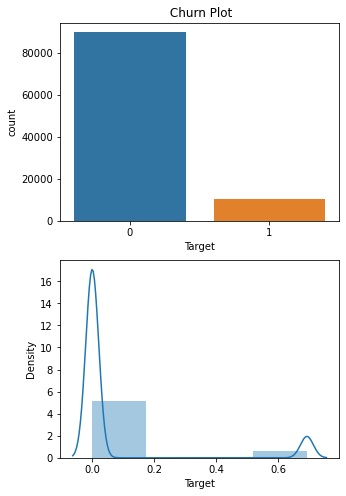

In [35]:
# Plotting the distribution of the Target variable
plt.figure(figsize=(5,8))
plt.subplot(2,1,1)
plt.title(" Churn Plot")
sns.countplot(telecom['Target'])

# Plotting the Log - transformed version of the Target varaible.
plt.subplot(2,1,2)
sns.distplot(np.log1p(telecom['Target']), bins=4)
plt.show()

__Observations:__

* The Chrun Rate appears to be around 10.2 %.

Since the data seem to be highly imbalanced hence we would need to introduce the class imbalance during the modelling.

__Frequency Distribution Analysis__

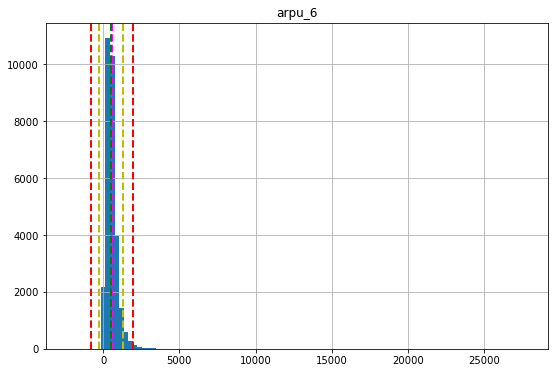

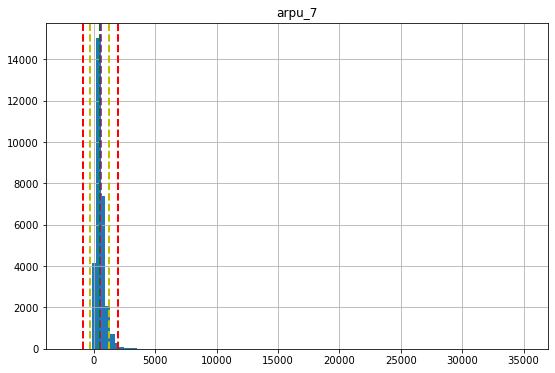

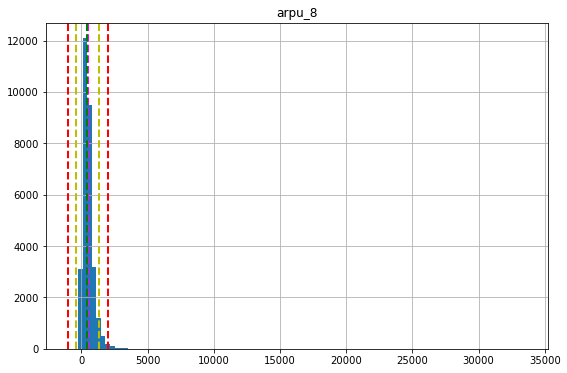

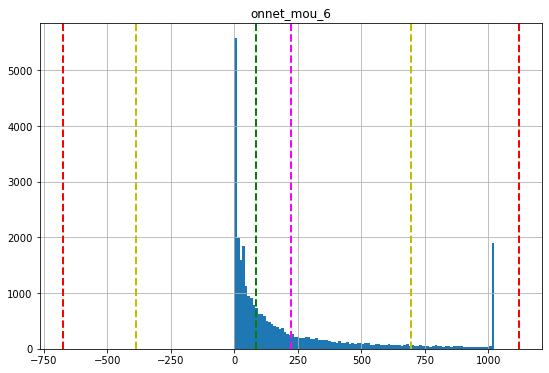

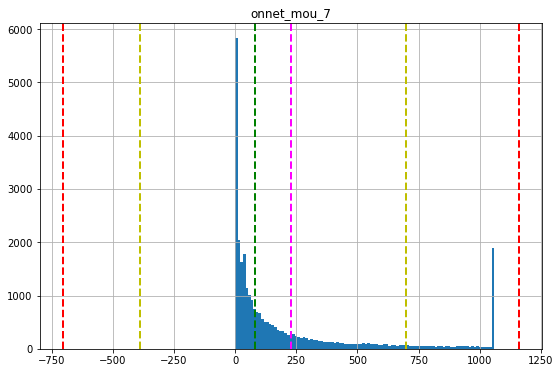

...

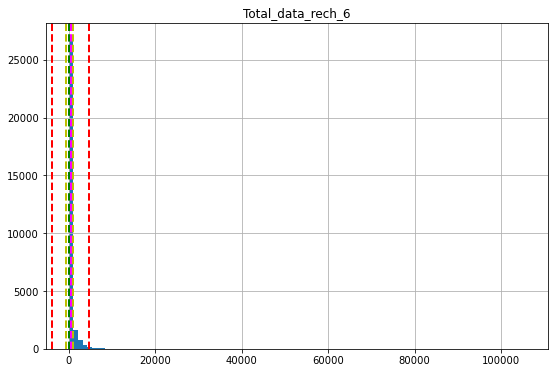

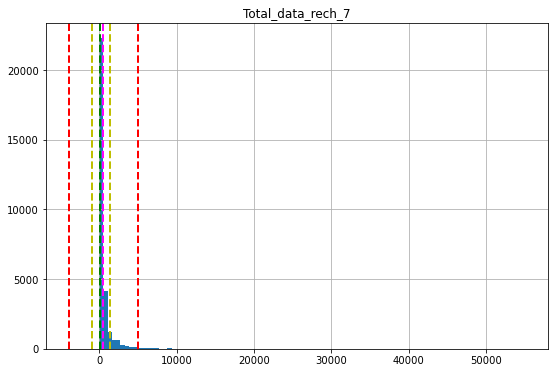

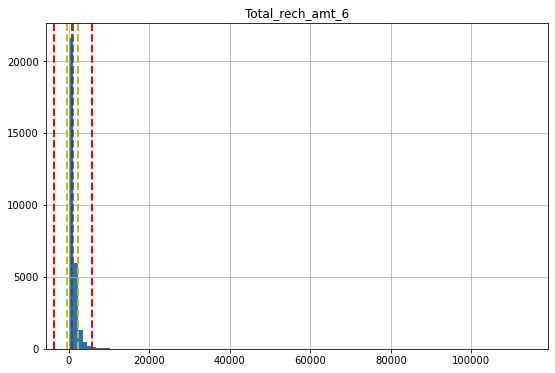

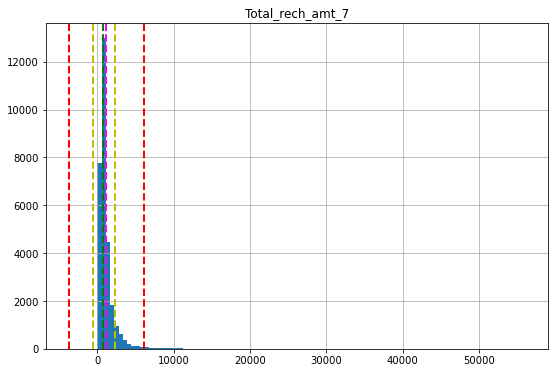

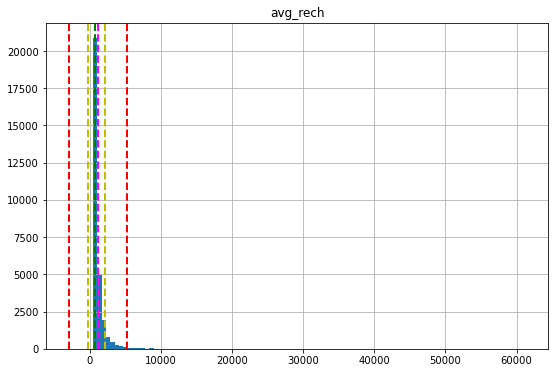

In [36]:
# Creating histograms for numeric columns in the dataframe.

numeric_features=telecom_top20.select_dtypes(['int64','float64']).columns
numeric_features=numeric_features.drop('mobile_number')

# Plot a histogram for each numeric feature
for col in numeric_features:
    fig = plt.figure(figsize=(9, 6))
    ax = fig.gca()
    feature = telecom_top20[col]
    feature.hist(bins=100, ax = ax)
    ax.axvline(feature.mean(), color='magenta', linestyle='dashed', linewidth=2) # line is for the mean
    ax.axvline(feature.median(), color='g', linestyle='dashed', linewidth=2)  # line is for the median
    ax.axvline(feature.mean()+3*feature.std(), color='r', linestyle='dashed', linewidth=2) # line is to find outliers following Gausian distribution having more than Mean + 3 Sigma
    ax.axvline(feature.mean()-3*feature.std(), color='r', linestyle='dashed', linewidth=2) # line is to find outliers following Gausian distribution having more than Mean - 3 Sigma
    IQR=feature.quantile(.75)-feature.quantile(.25)
    ax.axvline(feature.quantile(.75)+1.5*IQR, color='y', linestyle='dashed', linewidth=2) # line is to find outliers following fewer distribution 
    ax.axvline(feature.quantile(.25)-1.5*IQR, color='y', linestyle='dashed', linewidth=2) # line is to find outliers following fewer distribution
    ax.set_title(col)
plt.show()

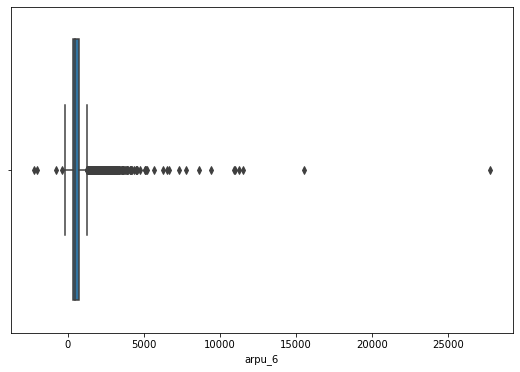

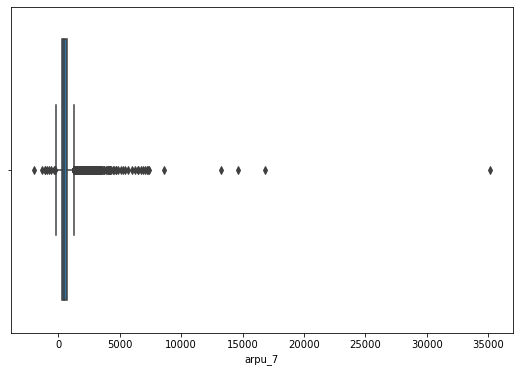

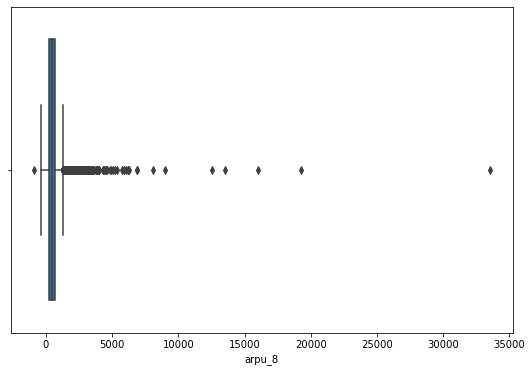

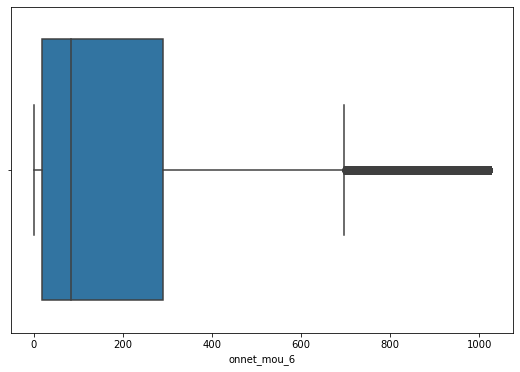

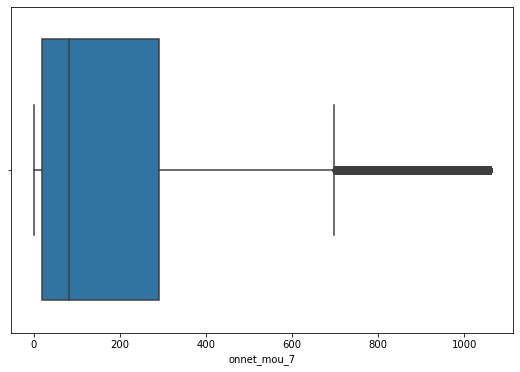

...

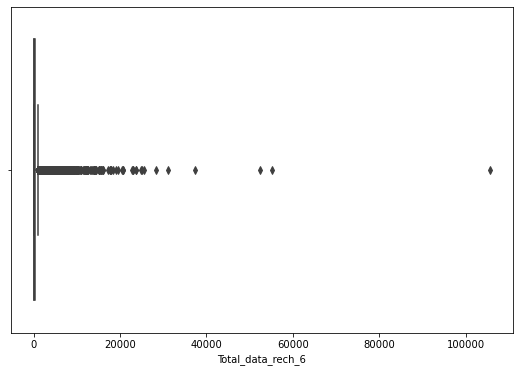

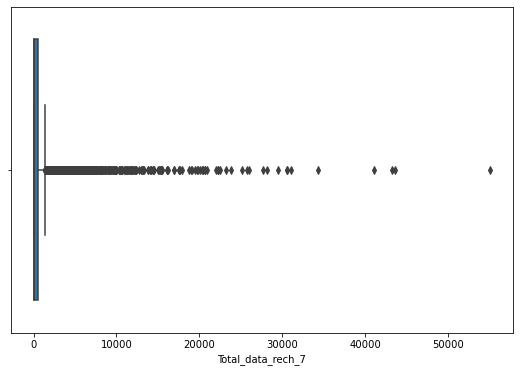

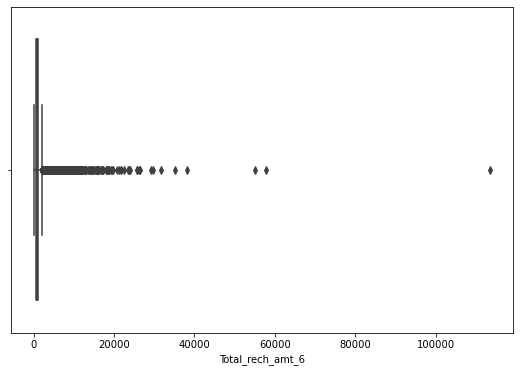

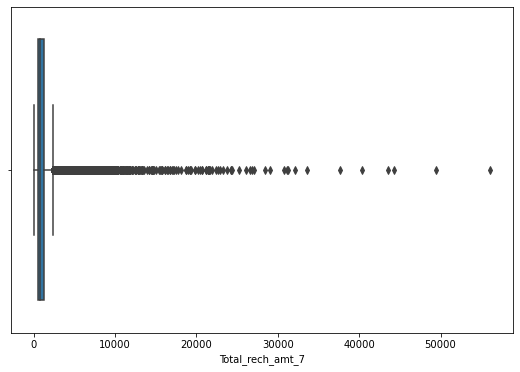

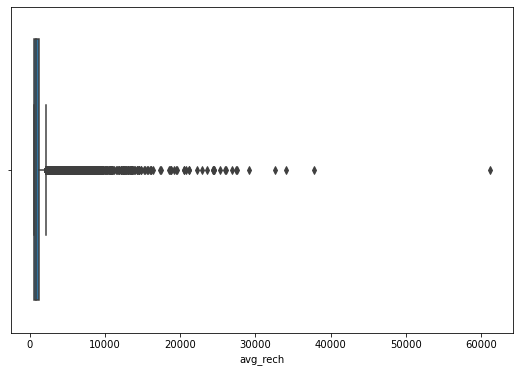

In [37]:
# Box plot creation for the numerical columns.

for col in numeric_features:
    fig = plt.figure(figsize=(9, 6))
    ax = fig.gca()
    feature = telecom_top20[col]
    sns.boxplot(feature, ax=ax, orient="v")
plt.show()

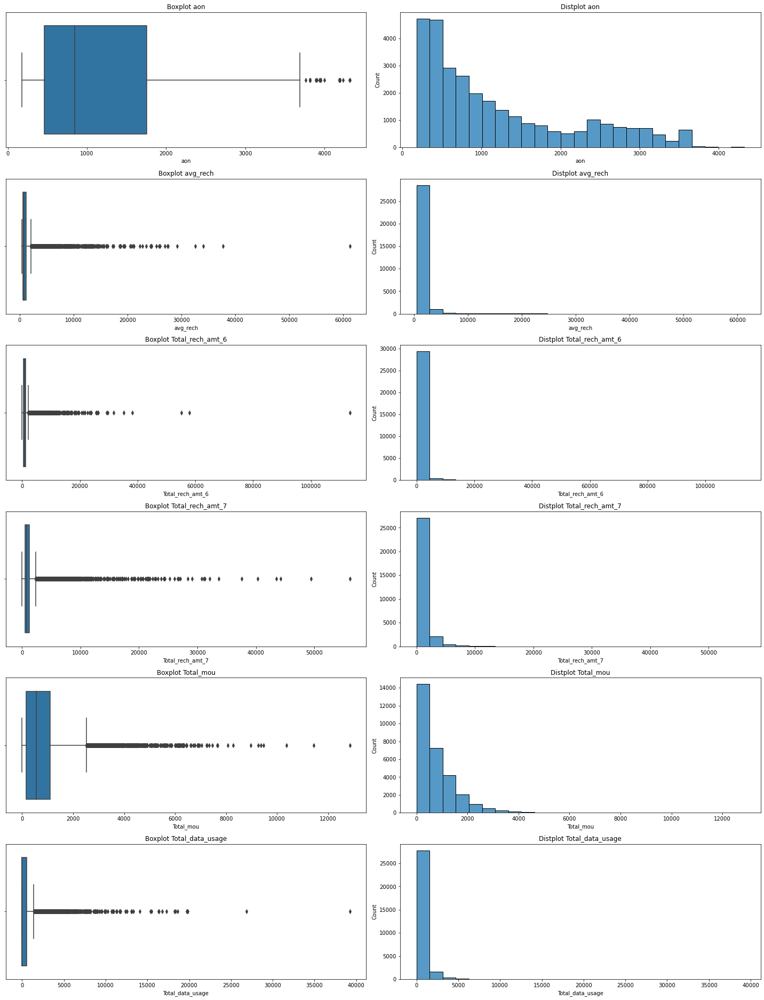

In [38]:
# Analyzing some of the important data variables to bring out useful insights.

var=["aon","avg_rech","Total_rech_amt_6","Total_rech_amt_7","Total_mou","Total_data_usage"]

a=1
fig = plt.figure(figsize=(20,30))
fig.tight_layout()
for i in var:
    plt.subplot(7,2,a)
    sns.boxplot(telecom_top20[i],orient='v')
    a=a+1
    plt.title('Boxplot {}'.format(i))
    fig.tight_layout()       
    
    plt.subplot(7,2,a)
    sns.histplot(telecom_top20[i],bins=25)
    a=a+1
    plt.title('Distplot {}'.format(i))   
    fig.tight_layout()

__Observations:__

In the months of June and July:
* Most of the customers stayed on the network for 1000-2000 days only.
* Most of the customers consumed less than 5000 MBs.
* Most of the customers didn't exceed 2000 minutes for voice calls.

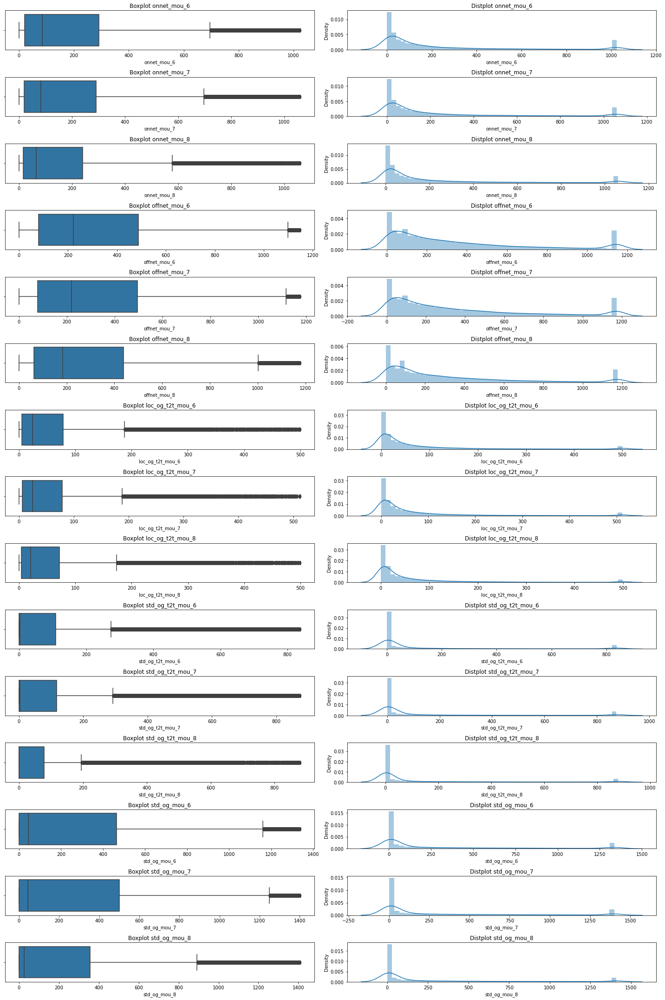

In [39]:
# Analyzing some of the important data variables to bring out useful insights.

var=['onnet_mou_6','onnet_mou_7','onnet_mou_8','offnet_mou_6','offnet_mou_7','offnet_mou_8','loc_og_t2t_mou_6','loc_og_t2t_mou_7','loc_og_t2t_mou_8','std_og_t2t_mou_6','std_og_t2t_mou_7','std_og_t2t_mou_8','std_og_mou_6','std_og_mou_7','std_og_mou_8']

a=1
fig = plt.figure(figsize=(20,30))
fig.tight_layout()
for i in var:
    plt.subplot(15,2,a)
    sns.boxplot(telecom_top20[i],orient='v')
    a=a+1
    plt.title('Boxplot {}'.format(i))
    fig.tight_layout()       
    
    plt.subplot(15,2,a)
    sns.distplot(telecom_top20[i])
    a=a+1
    plt.title('Distplot {}'.format(i))   
    fig.tight_layout()

 __Observations__
 
In the month of June, July and August: 
 * It appears that Customers usually make less STD calls and make more calls to different network users.

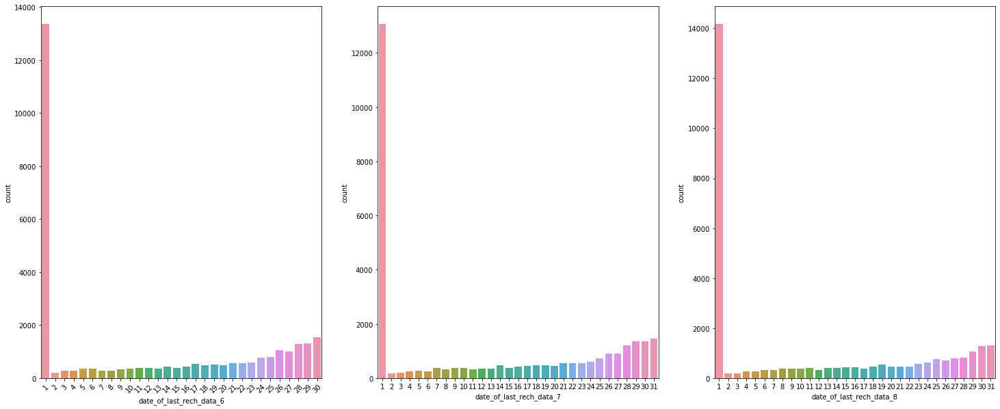

In [40]:
# Plot countplots to identify patterns in last recharge days.

fig = plt.figure(figsize=(25,10,))
plt.subplot(1,3,1)
plt.xticks(rotation=45)
sns.countplot(telecom_top20.date_of_last_rech_data_6)
plt.subplot(1,3,2)
sns.countplot(telecom_top20.date_of_last_rech_data_7)
plt.subplot(1,3,3)
sns.countplot(telecom_top20.date_of_last_rech_data_8)
plt.show()

__Observations__

* Looks most of the recharge are done in 1st day of month.

### Bivariate Analysis:
 Bivariate analysis is a statistical method to analyze relationship among 2 data variables and revealing the correlation that exists where as MultiVariate Analysis help us to analyze more than 2 variables.

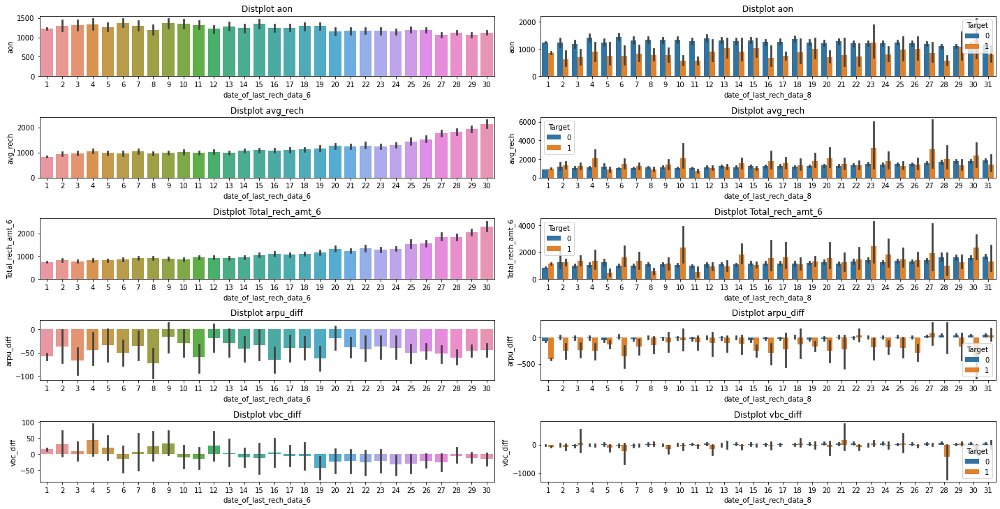

In [41]:
var=["aon","avg_rech","Total_rech_amt_6","arpu_diff",'vbc_diff']

a=1
fig = plt.figure(figsize=(20,30))
fig.tight_layout()
for i in var:
    plt.subplot(15,2,a)
    sns.barplot(telecom_top20.date_of_last_rech_data_6,telecom_top20[i])
    a=a+1
    plt.title('Distplot {}'.format(i))
    fig.tight_layout()       
    
    plt.subplot(15,2,a)
    sns.barplot(telecom_top20.date_of_last_rech_data_8,telecom_top20[i],hue=telecom_top20.Target)
    a=a+1
    plt.title('Distplot {}'.format(i))   
    fig.tight_layout()

__Observations__:

* We can see a drop in Average recharge, Total recharge amount,Average revenue per user (arpu) and volume based cost reduced in the 8th month overall as compared to the 6th month.

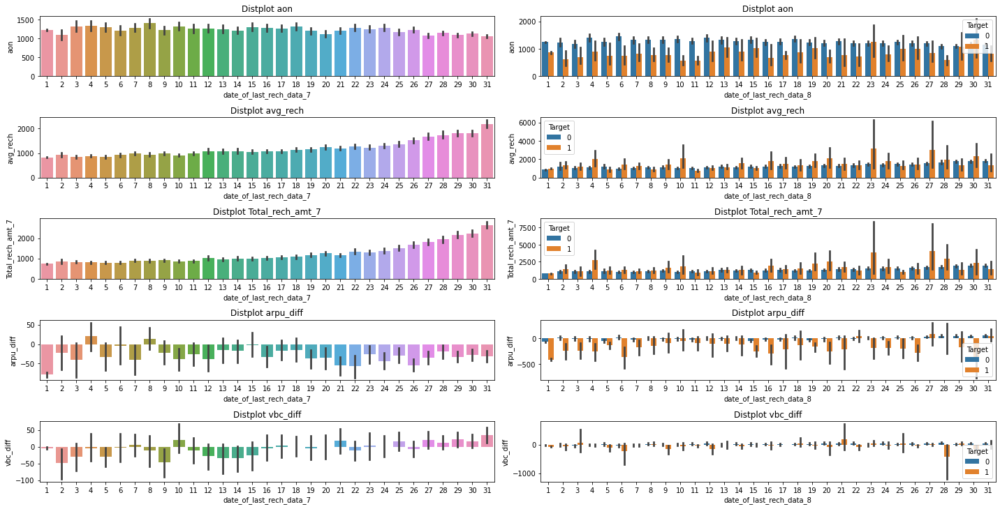

In [42]:
var=["aon","avg_rech","Total_rech_amt_7","arpu_diff",'vbc_diff']

a=1
fig = plt.figure(figsize=(20,30))
fig.tight_layout()
for i in var:
    plt.subplot(15,2,a)
    sns.barplot(telecom_top20.date_of_last_rech_data_7,telecom_top20[i])
    a=a+1
    plt.title('Distplot {}'.format(i))
    fig.tight_layout()       
    
    plt.subplot(15,2,a)
    sns.barplot(telecom_top20.date_of_last_rech_data_8,telecom_top20[i],hue=telecom_top20.Target)
    a=a+1
    plt.title('Distplot {}'.format(i))   
    fig.tight_layout()

__Observations__:

* We can see a drop in Average recharge, Total recharge amount,Average revenue per user (arpu) and volume based cost reduced in the 8th month overall as compared to the 7th month.

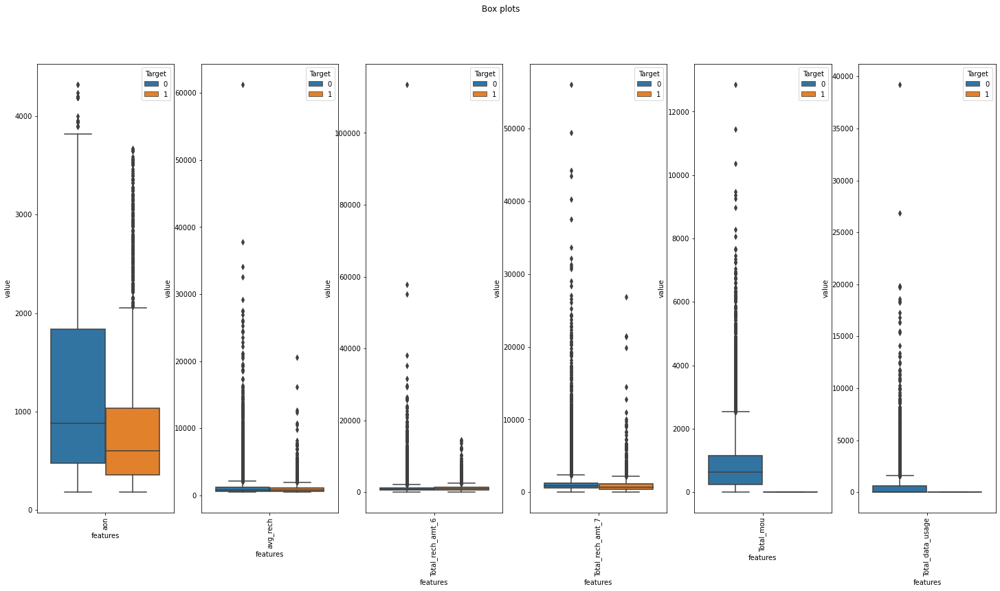

In [43]:
# Analyzing some of the important data variables w.r.t Target variable to bring out useful insights.

var=["aon","avg_rech","Total_rech_amt_6","Total_rech_amt_7","Total_mou","Total_data_usage"]
plt.figure(figsize=(25,12))
for i in range(0,6):
    plt.subplot(1,6,i+1)
    X = pd.concat([telecom_top20[var[i]], telecom_top20['Target']], axis=1)
    X = pd.melt(X,id_vars="Target",var_name="features",value_name='value')
    sns.boxplot(x="features", y="value", hue="Target", data=X)
    plt.xticks(rotation=90)    
    plt.suptitle('Box plots')

__Observations__:
* We can observe that people who churned out stayed on the network for less than 1000 days on an average.
* Also, people who churn out generally have less voicecall minutes and have lower data usage tendency.

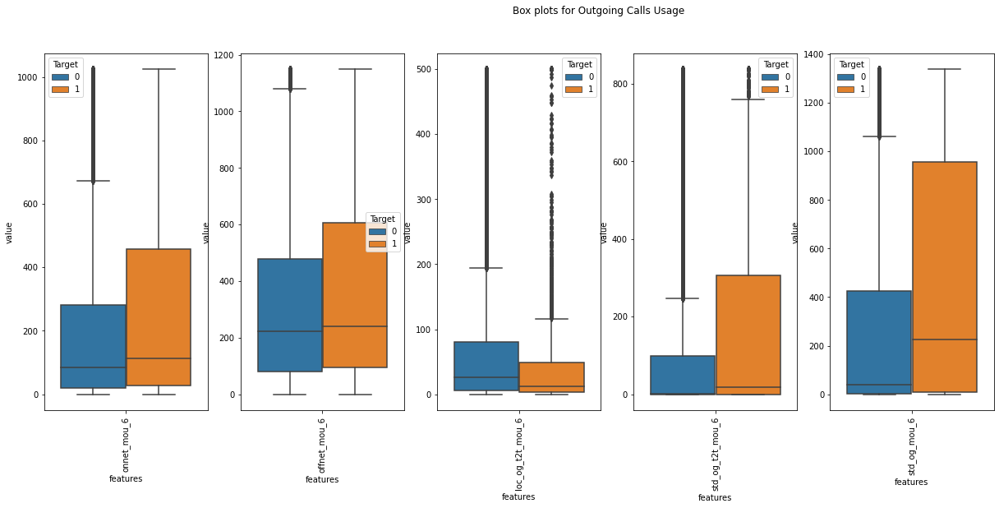

In [44]:
# Analyzing some of the important data variables of 6th month w.r.t Target variable to bring out useful insights.

var=['onnet_mou_6','offnet_mou_6','loc_og_t2t_mou_6','std_og_t2t_mou_6','std_og_mou_6']
plt.figure(figsize=(25,8))
for i in range(0,5):
    plt.subplot(1,6,i+1)
    X = pd.concat([telecom_top20[var[i]], telecom_top20['Target']], axis=1)
    X = pd.melt(X,id_vars="Target",var_name="features",value_name='value')
    sns.boxplot(x="features", y="value", hue="Target", data=X)
    plt.xticks(rotation=90)    
    plt.suptitle('Box plots for Outgoing Calls Usage')


__Observations__:
* From 6th month data,  we could observe customers who churned in 9th month, had made more STD calls and made high number OFFNET and ONNET calls.

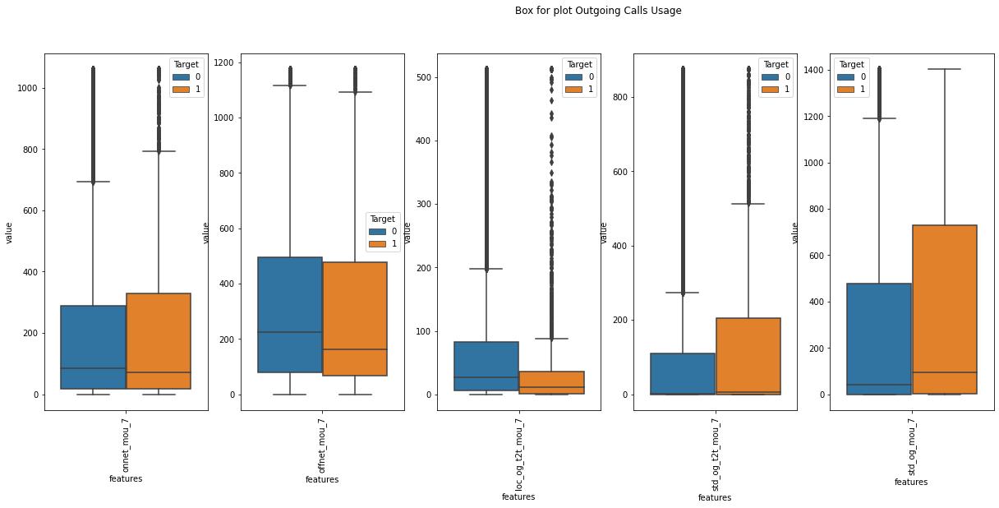

In [45]:
# Analyzing some of the important data variables of the 7th month w.r.t Target variable to bring out useful insights.

var=['onnet_mou_7','offnet_mou_7','loc_og_t2t_mou_7','std_og_t2t_mou_7','std_og_mou_7']
plt.figure(figsize=(25,8))
for i in range(0,5):
    plt.subplot(1,6,i+1)
    X = pd.concat([telecom_top20[var[i]], telecom_top20['Target']], axis=1)
    X = pd.melt(X,id_vars="Target",var_name="features",value_name='value')
    sns.boxplot(x="features", y="value", hue="Target", data=X)
    plt.xticks(rotation=90)    
    plt.suptitle('Box for plot Outgoing Calls Usage')

__Observations__:
* From 7th month data, we could observe that customers who churned out made more STD calls and local calls. Also, They had made more ONNET calls as well.
But low number of OFFNET calls which shows a slight reduction in usage here.

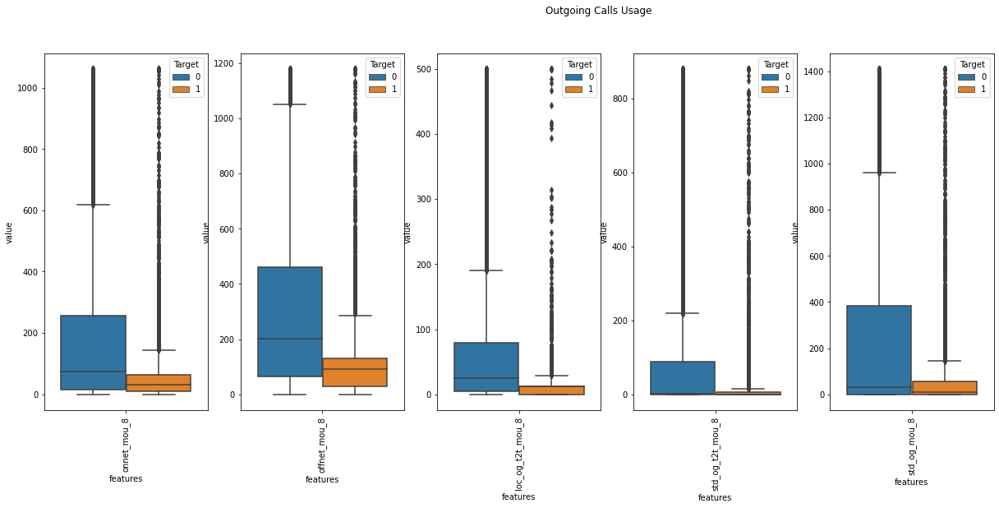

In [46]:
# Analyzing some of the important data variables of the 8th month w.r.t Target variable to bring out useful insights.

var=['onnet_mou_8','offnet_mou_8','loc_og_t2t_mou_8','std_og_t2t_mou_8','std_og_mou_8']
plt.figure(figsize=(25,8))
for i in range(0,5):
    plt.subplot(1,6,i+1)
    X = pd.concat([telecom_top20[var[i]], telecom_top20['Target']], axis=1)
    X = pd.melt(X,id_vars="Target",var_name="features",value_name='value')
    sns.boxplot(x="features", y="value", hue="Target", data=X)
    plt.xticks(rotation=90)    
    plt.suptitle('Outgoing Calls Usage')

__Observations__:
* From 8th month data, we could observe that customers who churned out drastically reduced number of STD calls,local calls. Overall reduction in ONNET and OFFNET calls frequency was seen.

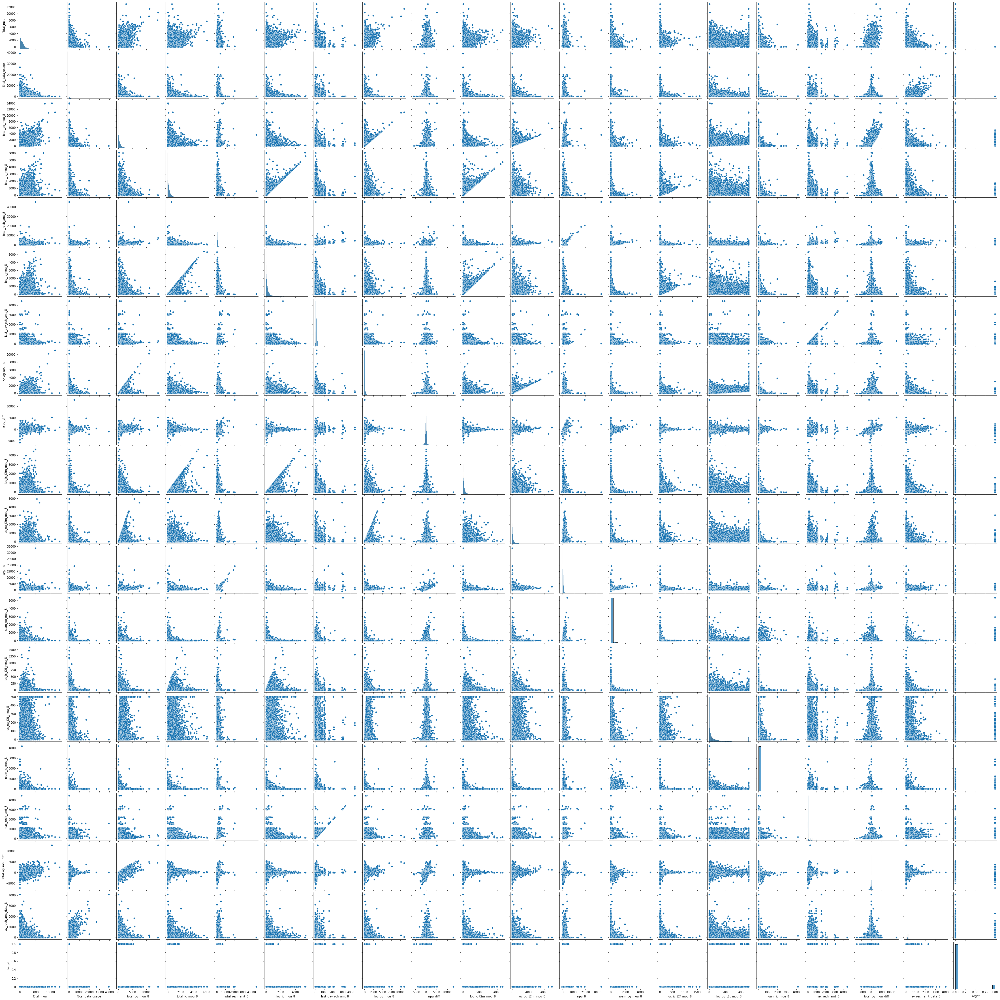

In [47]:
# Understanding Trend between the some important vairables and Target variable.

var=['Total_mou','Total_data_usage','total_og_mou_8', 'total_ic_mou_8', 'total_rech_amt_8', 'loc_ic_mou_8', 'last_day_rch_amt_8', 'loc_og_mou_8','arpu_diff','loc_ic_t2m_mou_8', 'loc_og_t2m_mou_8', 'date_of_last_rech_8','arpu_8','roam_og_mou_8', 'loc_ic_t2f_mou_8', 'loc_og_t2t_mou_8', 'roam_ic_mou_8', 'max_rech_amt_8', 'total_og_mou_diff', 'av_rech_amt_data_8','Target']
sns.pairplot(telecom_top20[var])

<AxesSubplot:>

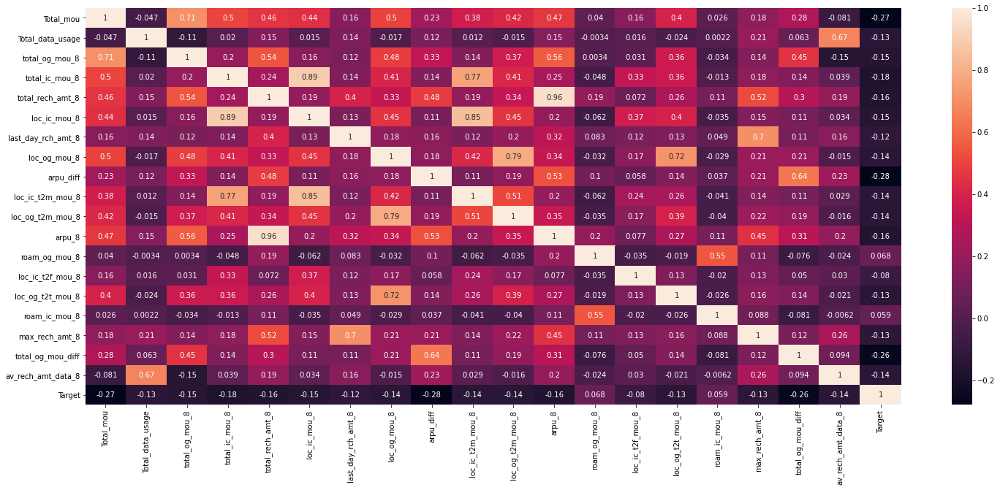

In [48]:
# Heatmap of some of the important data variables w.r.t Target variable to bring out useful insights.

plt.figure(figsize=(25,10))
sns.heatmap(telecom_top20[var].corr(),annot=True)

__Observations__:

* From the above pairplot and heatmap we could notice many fields are negatively correlated with the Target vairable. Also, some fields are related to other fields ( presence of multicollinearity).

### Understand Correlations:

In [49]:
# Correlation table 

telecom_top20.corr()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,Total_mou,Total_data_usage,Target,arpu_diff,vbc_diff,total_og_mou_diff,total_rech_data_diff,max_rech_data_diff,vol_2g_mb_diff,vol_3g_mb_diff,fb_user_diff,Total_data_rech_6,Total_data_rech_7,Total_rech_amt_6,Total_rech_amt_7,avg_rech
mobile_number,1.000000,0.033830,0.029606,0.034434,0.014983,0.014320,0.016705,0.030707,0.021174,0.032470,0.010750,-0.002397,0.005041,0.005777,-0.001375,-0.002988,0.081715,0.079264,0.077457,0.079305,0.076334,0.079715,0.051734,0.052730,0.056273,-0.011930,-0.014405,-0.006177,0.084172,0.081066,0.081875,-0.020968,-0.018269,-0.014665,-0.024943,-0.028250,-0.024645,0.026126,0.018299,0.022086,-0.035465,-0.036463,-0.027043,-0.003303,-0.002934,-0.003758,-0.018374,-0.020769,-0.012999,-0.006557,-0.000907,0.000608,0.021853,0.013831,0.019720,0.032833,0.029959,0.033023,0.063016,0.057588,0.059849,0.054892,0.056642,0.054119,0.068782,0.064242,0.066103,-0.001026,0.003857,-0.000492,-0.010498,-0.011139,-0.013044,0.014966,0.012050,0.013830,NaN,NaN,NaN,-0.006109,-0.004327,-0.008175,0.059021,0.054568,0.055421,-0.022649,-0.002471,-0.029687,0.003304,0.001803,0.001343,0.013455,0.009253,0.009260,-0.028704,-0.042862,-0.036353,0.032464,0.058169,0.058708,0.063461,0.045298,0.051996,0.044837,-0.020013,-0.019383,-0.010700,-0.038426,-0.027125,-0.000805,0.003901,0.011343,-0.040697,-0.039715,-0.031344,-0.010582,-0.008202,-0.001360,-0.011017,-0.001842,-0.015740,-0.018754,-0.019310,-0.019869,-0.010329,-0.006428,-0.016654,-0.013893,-0.002119,0.008776,0.009311,0.007369,-0.042137,-0.041104,-0.032541,0.003651,0.005744,0.014385,-0.014808,-0.013129,-0.009653,-0.018685,-0.018850,-0.007140,0.315511,-0.031976,-0.027987,-0.037743,0.041532,-0.008558,-0.029966,0.007135,0.001938,0.002589,0.015917,0.013742,-0.001315,0.012642,0.015501,-0.018244,-0.018421,-0.004703,-0.004994,-0.005710
arpu_6,0.033830,1.000000,0

In [50]:
telecom_top20.date_of_last_rech_6= pd.to_datetime(telecom_top20.date_of_last_rech_6)
telecom_top20.date_of_last_rech_7= pd.to_datetime(telecom_top20.date_of_last_rech_7)
telecom_top20.date_of_last_rech_8= pd.to_datetime(telecom_top20.date_of_last_rech_8)

In [51]:
##  Extracting day information from the data columns

telecom_top20.date_of_last_rech_6= telecom_top20.date_of_last_rech_6.dt.day
telecom_top20.date_of_last_rech_7= telecom_top20.date_of_last_rech_7.dt.day
telecom_top20.date_of_last_rech_8= telecom_top20.date_of_last_rech_8.dt.day

In [52]:
telecom_top20.describe()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,Total_mou,Total_data_usage,Target,arpu_diff,vbc_diff,total_og_mou_diff,total_rech_data_diff,max_rech_data_diff,vol_2g_mb_diff,vol_3g_mb_diff,fb_user_diff,Total_data_rech_6,Total_data_rech_7,Total_rech_amt_6,Total_rech_amt_7,avg_rech
count,2.995300e+04,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.0,29953.0,29953.0,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.00000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.0000

In [53]:
# Dropping the "Mobile number" field as it is not required in the further analysis.

telecom_top20 = telecom_top20.drop(["mobile_number"],axis=1)

#### Understand Correlations:

In [54]:
# Correlation table 

telecom_top20.corr()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,Total_mou,Total_data_usage,Target,arpu_diff,vbc_diff,total_og_mou_diff,total_rech_data_diff,max_rech_data_diff,vol_2g_mb_diff,vol_3g_mb_diff,fb_user_diff,Total_data_rech_6,Total_data_rech_7,Total_rech_amt_6,Total_rech_amt_7,avg_rech
arpu_6,1.000000,0.671846,0.612987,0.326552,0.217759,0.190567,0.487969,0.333169,0.300708,0.126893,0.083509,0.090328,0.196093,0.143347,0.124921,0.233497,0.184686,0.171138,0.330835,0.245411,0.219703,0.139404,0.114370,0.104217,0.047532,0.010440,0.012606,0.327438,0.246450,0.224791,0.232444,0.143712,0.121924,0.301433,0.181616,0.140260,0.066667,0.053517,0.043861,0.326937,0.200372,0.170469,0.467008,0.420852,0.413600,0.122595,0.068867,0.045086,0.054719,0.024346,0.015483,0.554358,0.363330,0.302143,0.081587,0.062809,0.063204,0.185868,0.149301,0.125821,0.051190,0.039152,0.037373,0.178759,0.142593,0.126049,0.088031,0.061527,0.056840,0.098471,0.065799,0.063160,0.034410,0.032510,0.022898,NaN,NaN,NaN,0.124549,0.085691,0.079647,0.225813,0.168902,0.150710,0.031316,-0.034175,-0.011413,0.103025,0.063114,0.070579,0.016130,0.023872,0.012220,0.349587,0.135940,0.119395,0.604021,0.337938,0.262047,0.284594,0.179319,0.030376,0.039638,0.266615,0.207485,0.199383,-0.103549,-0.192117,-0.120008,-0.175771,-0.122257,0.072743,-0.021833,0.025218,-0.165722,-0.208768,-0.161987,0.090339,0.020062,0.035046,-0.026583,0.029188,-0.062502,-0.098918,-0.077884,0.152422,0.070134,0.084636,-0.110485,-0.192959,-0.120682,-0.038924,-0.083953,-0.061163,-0.158638,-0.194203,-0.152276,0.176303,0.080919,0.103636,-0.002644,-0.025318,-0.017510,-0.122402,-0.203698,-0.137782,0.041525,0.058542,0.055092,0.112315,0.294896,0.063961,0.067672,-0.250499,-0.034743,-0.219414,0.027127,-0.000823,0.009121,-0.038359,0.034001,0.088875,-0.023925,0.419394,0.210553,0.368187
arpu_7,0.6718

# Step 4: Modelling

In [55]:
telecom_top20.shape

(29953, 166)

Since all are numeric variables we can skip the step of creating Dummy variables

## Model 1: Desicion Tree

### Splitting the Data into Training and Testing Sets

As you know, the first basic step for regression is performing a train-test split.

In [56]:
# Creating X and Y variables.

y= telecom_top20.Target
X= telecom_top20.drop('Target',axis=1)

In [57]:
# Spliting the data in Train and Test set.

X_train,X_test,y_train,y_test = train_test_split(X,y,train_size=0.7,stratify=y, random_state=100) # to ensure equal distribution of the values.

In [58]:
# Checking the unique value counts

y_test.value_counts(1)

0    0.918763
1    0.081237
Name: Target, dtype: float64

In [59]:
# Checking the unique value counts

y_train.value_counts(1)

0    0.918777
1    0.081223
Name: Target, dtype: float64

In [60]:
# Creating fucntions to evaluate the model accuracy and plot the results.

def evaluate_model(dt_classifier):
    print("Train Accuracy :", metrics.accuracy_score(y_train, dt_classifier.predict(X_train)))
    print("Train Confusion Matrix:")
    con_mat_train=metrics.confusion_matrix(y_train, dt_classifier.predict(X_train))
    print(metrics.confusion_matrix(y_train, dt_classifier.predict(X_train)))
    TN = con_mat_train[0][0]
    FP = con_mat_train[0][1]
    FN = con_mat_train[1][0]
    TP = con_mat_train[1][1]
    sensitivity=TP/(TP+FN)
    specificity= TN/(TN+FP)
    print("Train sensitivity :",sensitivity)
    print("Train specificity :",specificity)
    print("-"*50)
    con_mat_test=metrics.confusion_matrix(y_test, dt_classifier.predict(X_test))
    print("Test Accuracy :", metrics.accuracy_score(y_test, dt_classifier.predict(X_test)))
    print("Test Confusion Matrix:")
    print(metrics.confusion_matrix(y_test, dt_classifier.predict(X_test)))
    TN = con_mat_test[0][0]
    FP = con_mat_test[0][1]
    FN = con_mat_test[1][0]
    TP = con_mat_test[1][1]
    sensitivity=TP/(TP+FN)
    specificity= TN/(TN+FP)
    print("Test sensitivity :",sensitivity)
    print("Test specificity :",specificity)
    
    
def get_dt_graph(dt_classifier):
    plt.figure(figsize=(60,30))
    grph=plot_tree(dt_classifier, feature_names = X.columns,class_names=['No Churn', "Churn"],filled=True);
    return grph

In [61]:
# Instantiate Decision Tree Classifier object.

dt = DecisionTreeClassifier(random_state=42)

Hyper-parameter tuning for the Decision Forest.

In [62]:
# Assigning Range of values for hyperparameter tuning. 

params={'max_depth': [2,3,5,10,20],
       'min_samples_leaf':[5,10,20,50,100,500,1000],
       'criterion':['gini','entropy']}

In [63]:
# Performing crosss validation for hyperparameter tuning.

grid_search = GridSearchCV(estimator=dt,
                           param_grid=params,
                           cv=4,
                           n_jobs=-1, verbose=1, scoring="accuracy")



In [64]:
X_train.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,Total_mou,Total_data_usage,arpu_diff,vbc_diff,total_og_mou_diff,total_rech_data_diff,max_rech_data_diff,vol_2g_mb_diff,vol_3g_mb_diff,fb_user_diff,Total_data_rech_6,Total_data_rech_7,Total_rech_amt_6,Total_rech_amt_7,avg_rech
70087,521.407,452.594,-0.500,146.33,79.04,5.18,709.740000,686.840000,0.000000,0.00,9.46,2.29,0.00,60.21,6.09,5.48,9.44,0.00,193.91,112.84,0.00,6.64,11.68,0.00,0.00,0.00,0.0,206.04,133.98,0.00,140.84,60.53,0.00,506.29,511.16,0.00,0.00,0.00,0.0,647.14,571.69,0.00,2.88,0.00,0.00,1.99,4.89,0.00,0.0,0.0,0.0,858.08,710.58,0.00,15.09,11.53,0.00,118.24,144.59,0.00,0.00,9.63,0.00,133.34,165.76,0.00,0.00,0.00,0.00,3.01,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,3.01,0.00,0.00,164.59,186.03,0.00,0.00,0.00,0.00,28.23,20.26,0.00,0.00,0.00,0.00,11,10,3,0,110,110,0,30,23,26,0,110,0,1,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,-1.0,-1.0,-1.0,0,0,0,0,0,0,0,0,0,0,0,0,-1.0,-1.0,-1.0,492,0.00,0.00,0.00,0.00,0.00,-487.5005,0.000,-784.330,0.0,0.0,0.000,0.000,0.0,0.0,0.0,666.0,500.0,583.0
90560,928.353,553.882,789.034,196.91,148.58,235.89,794.930000,448.360000,827.610000,0.00,0.00,0.00,0.00,0.00,0.00,139.39,128.63,188.06,530.21,342.93,724.23,8.03,13.43,20.43,0.88,3.48,0.0,677.64,484.99,932.73,57.51,19.94,47.83,189.11,66.84,78.99,56.03,6.48,0.0,302.66,93.28,126.83,0.38,0.93,3.94,11.15,17.73,0.00,0.0,0.0,0.0,991.84,596.94,1063.51,103.29,106.84,120.68,215.44,123.21,256.74,4.31,10.49,11.99,323.06,240.56,389.43,7.48,32.43,61.86,158.99,54.53,81.54,0.00,2.36,0.00,0.0,0.0,0.0,166.48,89.33,143.41,742.06,611.94,814.36,0.00,0.00,0.25,244.78,268.63,261.39,7.73,13.41,19.86,13,10,11,1166,250,200,550,29,30,27,0,0,130,29,7,15,2.0,3.0,154.0,154.0,154.0,4.0,2.0,3.0,0.0,0.0,0.0,177.0,200.0,131.50,250.87,173.99,0.00,83.57,

In [65]:
grid_search.fit(X_train, y_train)

Fitting 4 folds for each of 70 candidates, totalling 280 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done 280 out of 280 | elapsed:    9.2s finished


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100, 500, 1000]},
             scoring='accuracy', verbose=1)

In [66]:
# Finding the best parameters for the Random Forest model.

dt_best=grid_search.best_estimator_
dt_best

DecisionTreeClassifier(max_depth=2, min_samples_leaf=5, random_state=42)

In [67]:
# Evaluating "accuracy" , "sensitivity" and "specificity" for the model created.

evaluate_model(dt_best)

Train Accuracy : 1.0
Train Confusion Matrix:
[[19264     0]
 [    0  1703]]
Train sensitivity : 1.0
Train specificity : 1.0
--------------------------------------------------
Test Accuracy : 1.0
Test Confusion Matrix:
[[8256    0]
 [   0  730]]
Test sensitivity : 1.0
Test specificity : 1.0


[Text(2008.8000000000002, 1359.0, 'Total_mou <= 0.015\ngini = 0.149\nsamples = 20967\nvalue = [19264, 1703]\nclass = No Churn'),
 Text(1339.2, 815.3999999999999, 'Total_data_usage <= 0.015\ngini = 0.243\nsamples = 1983\nvalue = [280, 1703]\nclass = Churn'),
 Text(669.6, 271.79999999999995, 'gini = 0.0\nsamples = 1703\nvalue = [0, 1703]\nclass = Churn'),
 Text(2008.8000000000002, 271.79999999999995, 'gini = 0.0\nsamples = 280\nvalue = [280, 0]\nclass = No Churn'),
 Text(2678.4, 815.3999999999999, 'gini = 0.0\nsamples = 18984\nvalue = [18984, 0]\nclass = No Churn')]

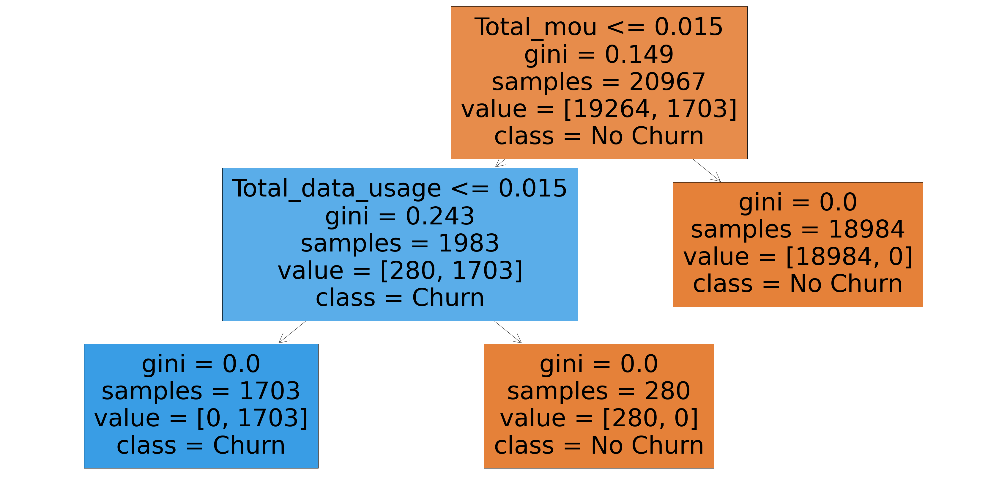

In [68]:
# Plotting the ROC curve to understand the tradeoff between sensitivity and specificity

get_dt_graph(dt_best)

## Model 2: Random Forest

In [69]:
# Creating X and Y variables.
y= telecom_top20.Target
X= telecom_top20.drop('Target',axis=1)

In [70]:
# Spliting the data in Train and Test set.

X_train,X_test,y_train,y_test = train_test_split(X,y,train_size=0.7,stratify=y, random_state=100) # to ensure equal distribution of the values.

In [71]:
# Instantiate Random Forest Classifier object.

rf=RandomForestClassifier(random_state=42, n_jobs=-1,class_weight="balanced")

 Hyper-parameter tuning for the Random Forest

In [72]:
# Assigning Range of values for hyperparameter tuning. 

params = {
    'max_depth': [2,3,5,10,20],
    'min_samples_leaf': [5,10,20,50,100,200],
    'n_estimators': [10, 25, 50, 100]
}

In [73]:
# Performing crosss validation for hyperparameter tuning.

grid_search=GridSearchCV(estimator=rf,
                         param_grid=params,
                        cv=4,
                        n_jobs=-1, verbose=1, scoring="accuracy")


grid_search.fit(X_train,y_train)

Fitting 4 folds for each of 120 candidates, totalling 480 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   17.2s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 480 out of 480 | elapsed:  1.4min finished


GridSearchCV(cv=4,
             estimator=RandomForestClassifier(class_weight='balanced',
                                              n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100, 200],
                         'n_estimators': [10, 25, 50, 100]},
             scoring='accuracy', verbose=1)

In [74]:
# Finding the best parameters for the Random Forest model.

rf_best = grid_search.best_estimator_
rf_best

RandomForestClassifier(class_weight='balanced', max_depth=10,
                       min_samples_leaf=5, n_jobs=-1, random_state=42)

In [75]:
# Evaluating "accuracy" , "sensitivity" and "specificity" for the model created.

evaluate_model(rf_best)

Train Accuracy : 0.9992845900701102
Train Confusion Matrix:
[[19249    15]
 [    0  1703]]
Train sensitivity : 1.0
Train specificity : 0.9992213455149501
--------------------------------------------------
Test Accuracy : 0.9972178945025595
Test Confusion Matrix:
[[8240   16]
 [   9  721]]
Test sensitivity : 0.9876712328767123
Test specificity : 0.998062015503876


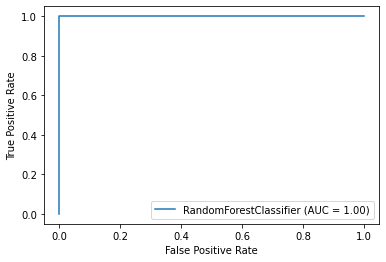

In [76]:
# Plotting the ROC curve to understand the tradeoff between sensitivity and specificity.

plot_roc_curve(rf_best, X_train, y_train)
plt.show()

In [77]:
# Fetching important features

rf_best.feature_importances_

array([1.95143904e-03, 2.37108564e-03, 2.11325931e-02, 1.85673714e-03,
       1.22084226e-03, 3.01865054e-03, 2.11317496e-03, 1.88830166e-03,
       7.05594467e-03, 7.87681808e-04, 6.46117524e-04, 1.39129217e-02,
       4.31628460e-04, 1.83059619e-03, 1.47120719e-02, 1.13618618e-03,
       1.43596545e-03, 1.58138980e-02, 1.32180423e-03, 1.82979024e-03,
       1.41411640e-02, 8.92025737e-04, 7.46265549e-04, 7.21308786e-03,
       3.91813574e-04, 5.22265506e-04, 7.31172357e-04, 2.02077897e-03,
       1.63639623e-03, 3.03949734e-02, 9.38439809e-04, 8.86957710e-04,
       1.06738335e-03, 1.15473657e-03, 1.82601575e-03, 4.54367802e-03,
       2.18320449e-04, 3.34226803e-04, 2.27948033e-04, 1.95927608e-03,
       1.82626968e-03, 3.79806297e-03, 3.05097605e-04, 5.51835013e-04,
       3.26625008e-04, 5.91316707e-04, 8.20727266e-04, 2.18015861e-03,
       3.10015037e-04, 1.07086159e-05, 1.86414142e-05, 2.07106505e-03,
       1.88515368e-03, 3.36763990e-02, 1.33512158e-03, 1.50223536e-03,
      

In [78]:
# Storing the important variables and beta values in a dataframe.

imp_df = pd.DataFrame({
    "Varname": X_train.columns,
    "Imp": rf_best.feature_importances_
})

In [79]:
# Sorting the dataframe.

df_rf=imp_df.sort_values(by="Imp", ascending=False)

In [80]:
df_rf.head()

,Varname,Imp
150,Total_mou,0.328149
151,Total_data_usage,0.075699
83,total_ic_mou_8,0.045904
53,total_og_mou_8,0.033676
96,total_rech_amt_8,0.031051


In [81]:
# List of tope 20 variables.

col_imp=df_rf.iloc[0:20,0]
imp_var_rf=list(col_imp)
imp_var_rf

['Total_mou',
 'Total_data_usage',
 'total_ic_mou_8',
 'total_og_mou_8',
 'total_rech_amt_8',
 'loc_og_mou_8',
 'last_day_rch_amt_8',
 'arpu_8',
 'loc_ic_t2m_mou_8',
 'loc_ic_mou_8',
 'arpu_diff',
 'total_og_mou_diff',
 'loc_og_t2t_mou_8',
 'date_of_last_rech_8',
 'roam_og_mou_8',
 'loc_og_t2m_mou_8',
 'roam_ic_mou_8',
 'max_rech_amt_8',
 'date_of_last_rech_data_8',
 'loc_ic_t2t_mou_8']

## Model 2: Random Forest Model with PCA

- While computng the principal components, we must not include the entire dataset. Model building is all about doing well on the data we haven't seen yet!
- So we'll calculate the PCs using the train data, and apply them later on the test data

In [82]:
# Creating X and Y variables.

y= telecom_top20.Target
X= telecom_top20.drop('Target',axis=1)

In [83]:
# Spliting the data in Train and Test set.

X_train,X_test,y_train,y_test = train_test_split(X,y,train_size=0.7,stratify=y, random_state=100) # to ensure equal distribution of the values.

In [84]:
col = X_train.columns

Fitting PCA with the Train data.

In [85]:
pca = PCA(random_state=42)

In [86]:
pca.fit(X_train)

PCA(random_state=42)

In [87]:
# Fetching the list of Principal components.

pca.components_

array([[ 3.24922221e-02,  4.01855627e-02,  3.25442035e-02, ...,
         3.84155746e-01,  4.60583581e-01,  4.22369664e-01],
       [ 1.41130892e-01,  1.68720754e-01,  1.72935619e-01, ...,
         9.15080783e-02,  1.67604836e-01,  1.29556457e-01],
       [ 7.05384898e-02, -3.50225251e-02, -1.54285377e-02, ...,
         5.70803476e-01, -4.53173620e-01,  5.88149280e-02],
       ...,
       [ 0.00000000e+00, -9.73625774e-19, -2.28916770e-18, ...,
        -1.13231251e-05, -1.13231251e-05,  2.26462501e-05],
       [-0.00000000e+00,  2.23670439e-18,  4.39118549e-19, ...,
         1.15897112e-05,  1.15897112e-05, -2.31794224e-05],
       [-3.16227766e-01, -3.16227766e-01,  6.32455532e-01, ...,
         1.26548078e-15,  8.76035355e-16, -1.50292105e-15]])

In [88]:
# Calculating cumulative sum with the help of explained variance ratio for each component.

var_cumu=np.cumsum(pca.explained_variance_ratio_)

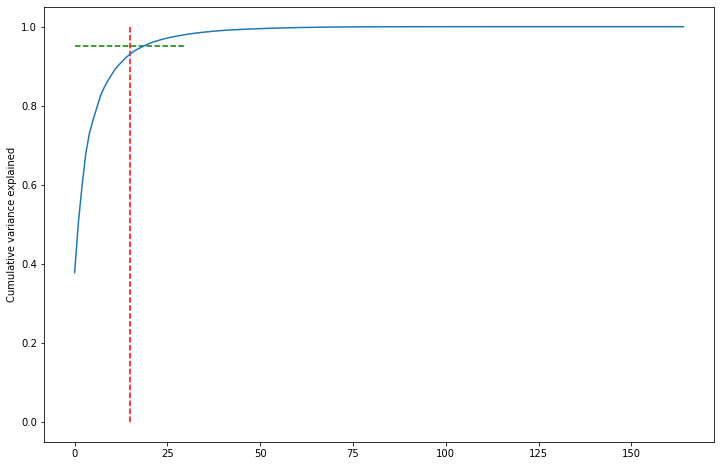

In [89]:
#Making a scree plot for the explained variance

fig = plt.figure(figsize=[12,8])
plt.vlines(x=15, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.95, xmax=30, xmin=0, colors="g", linestyles="--")
plt.plot(var_cumu)
plt.ylabel("Cumulative variance explained")
plt.show()

Performing PCA with the help of 14 components.

In [90]:
pca_final = IncrementalPCA(n_components=14)

In [91]:
df_train_pca = pca_final.fit_transform(X_train)

In [92]:
df_test_pca = pca_final.transform(X_test)

In [93]:
# understanding the train and test datasets creating after PCA

print(df_train_pca.shape)
print(df_test_pca.shape)

(20967, 14)
(8986, 14)


<AxesSubplot:>

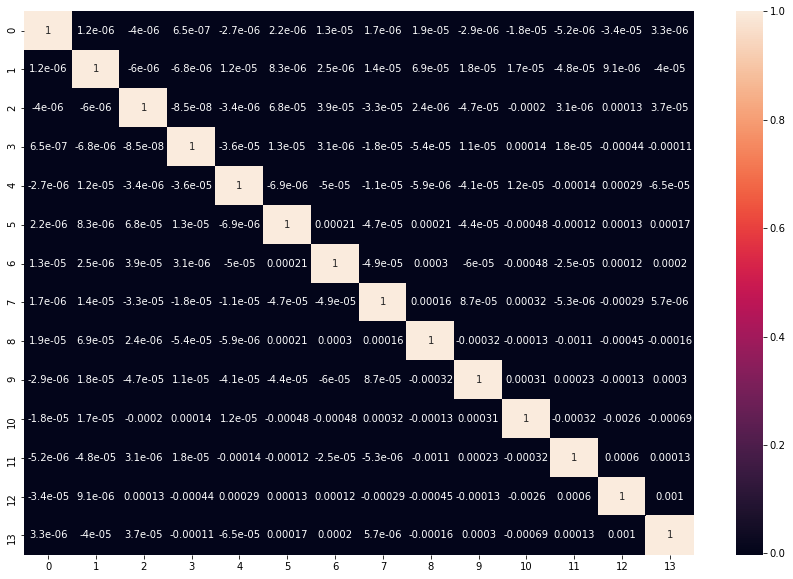

In [94]:
# Creating heatmap using Train data correlations

corrmat = np.corrcoef(df_train_pca.transpose())
plt.figure(figsize=[15,10])
sns.heatmap(corrmat, annot=True)

In [95]:
# Assigning Range of values for hyperparameter tuning. 

params = {
    'max_depth': [2,3,5,10,20],
    'min_samples_leaf': [5,10,20,50,100,200],
    'n_estimators': [10, 25, 50, 100]
}

In [96]:
# Performing crosss validation for hyperparameter tuning.

grid_search=GridSearchCV(estimator=rf,
                         param_grid=params,
                        cv=4,
                        n_jobs=-1, verbose=1, scoring="accuracy")

In [97]:
# Fitting the Train data on grid_search.

grid_search.fit(df_train_pca,y_train)

Fitting 4 folds for each of 120 candidates, totalling 480 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:   20.9s
[Parallel(n_jobs=-1)]: Done 450 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 480 out of 480 | elapsed:  1.3min finished


GridSearchCV(cv=4,
             estimator=RandomForestClassifier(class_weight='balanced',
                                              n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100, 200],
                         'n_estimators': [10, 25, 50, 100]},
             scoring='accuracy', verbose=1)

In [98]:
# Finding the best parameters for the Random Forest model.

rf_pca=grid_search.best_estimator_

In [99]:
rf_pca

RandomForestClassifier(class_weight='balanced', max_depth=20,
                       min_samples_leaf=5, n_estimators=50, n_jobs=-1,
                       random_state=42)

In [100]:
# Evaluating  "accuracy" , "sensitivity" and "specificity" for the model created.

print("Train Accuracy :", metrics.accuracy_score(y_train, rf_pca.predict(df_train_pca)))
print("Train Confusion Matrix:")
print(metrics.confusion_matrix(y_train, rf_pca.predict(df_train_pca)))
print("-"*50)
print("Test Accuracy :", metrics.accuracy_score(y_test, rf_pca.predict(df_test_pca)))
print("Test Confusion Matrix:")
print(metrics.confusion_matrix(y_test, rf_pca.predict(df_test_pca)))

Train Accuracy : 0.9777269041827634
Train Confusion Matrix:
[[18812   452]
 [   15  1688]]
--------------------------------------------------
Test Accuracy : 0.9365679946583575
Test Confusion Matrix:
[[7951  305]
 [ 265  465]]


In [101]:
# Fetching important features and storing in a dataframe.

imp_df = pd.DataFrame({
    "Varname": X_train.columns,
    "Imp": rf_best.feature_importances_
})

In [102]:
# Sorting the dataframe

df=imp_df.sort_values(by="Imp", ascending=False)

In [103]:
# List of top 14 important features/variables.

col_imp=df.iloc[0:14,0]
imp_var=list(col_imp)
imp_var

['Total_mou',
 'Total_data_usage',
 'total_ic_mou_8',
 'total_og_mou_8',
 'total_rech_amt_8',
 'loc_og_mou_8',
 'last_day_rch_amt_8',
 'arpu_8',
 'loc_ic_t2m_mou_8',
 'loc_ic_mou_8',
 'arpu_diff',
 'total_og_mou_diff',
 'loc_og_t2t_mou_8',
 'date_of_last_rech_8']

<AxesSubplot:>

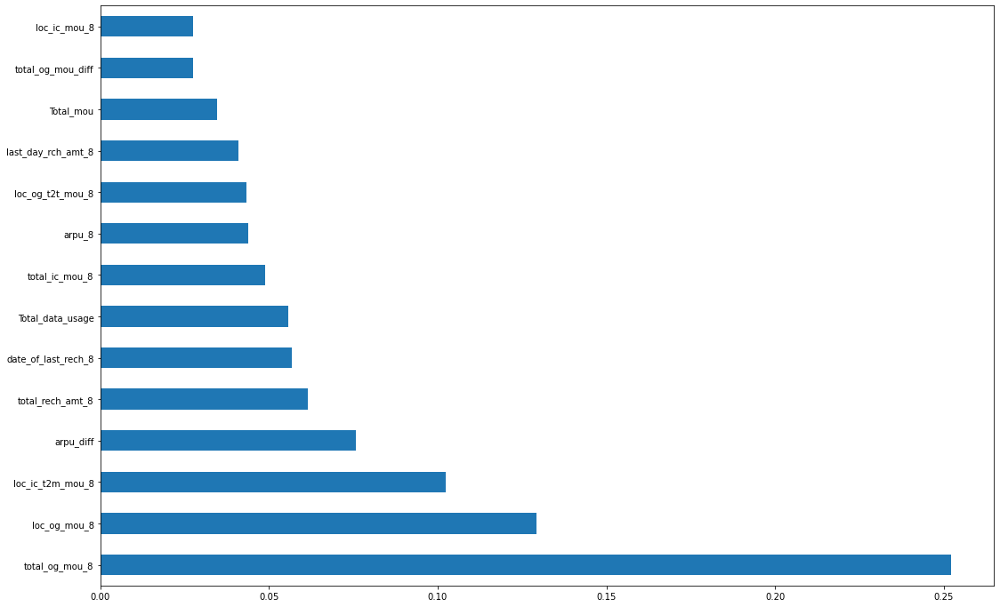

In [104]:
# plot the chart with top 20 important features.

(pd.Series(rf_pca.feature_importances_, index=imp_var).nlargest(14).plot(kind='barh', figsize=(18,12)))

## Model 4 : Logistic Regression with RFE

In [105]:
# Creating X and Y variables.

y= telecom_top20.Target
X= telecom_top20.drop('Target',axis=1)

In [106]:
# Spliting the data in Train and Test set.

X_train,X_test,y_train,y_test = train_test_split(X,y,train_size=0.7,stratify=y, random_state=100) # to ensure equal distribution of the values.

### Need to Scale the Training Dataset:

#### Scaling helps to normalize or standardize the data values within a meaningful range.

It is extremely important to rescale the variables so that they have a comparable scale. If we don't have comparable scales, then some of the coefficients as obtained by fitting the regression model might be very large or very small as compared to the other coefficients

The two main reasons for scaling the features are:
* Ease of interpretation
* Faster convergence for gradient descent methods

In [107]:
# Creating Standard Scaler object.

scaler = StandardScaler()

# Storing list of Train data variables.

col=list(X_train.columns)

In [108]:
# Scaling - Fit and Transform the Train dataset.

X_train[col]=scaler.fit_transform(X_train[col])

In [109]:
#Scaling the Test dataset.

X_test[col]=scaler.transform(X_test[col])

In [110]:
# Instantiate Logistic Regression model.

lr_model=LogisticRegression(class_weight='balanced')

In [111]:
# Fitting the model

rfe = RFE(lr_model, 25)             # running RFE with 50 variables as output
rfe = rfe.fit(X_train, y_train)

In [112]:
# Storing the top 25 important variables from RFE into a variable.

col = X_train.columns[rfe.support_]


In [113]:
# Fitting Logistic Regression model using the RFE variables.

X_train_sm = sm.add_constant(X_train[col])
log_reg = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
LR = log_reg.fit()
LR.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 Target   No. Observations:                20967
Model:                            GLM   Df Residuals:                    20941
Model Family:                Binomial   Df Model:                           25
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Mon, 31 May 2021   Deviance:                          nan
Time:                        22:51:54   Pearson chi2:                 6.19e+18
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                    -1.713e+15   4.63e+05   -3.7e+09      0.000   -1.71e+15   -1.71e+15
onnet_mou_7               1.875e+14    8.6e+05   2.18e+08      0.000    1.88e+14    1.88e+14
onnet_mou_8               -2.35e+13   1.06e+06  -2.21e+07      0.000   -2.35e+13   -2.35e+13
offnet_mou_6              1.273e+14   6.39e+05   1.99e+08      0.000    1.27e+14    1.27e+14
offnet_mou_8              2.379e+13   1.08e+06   2.21e+07      0.000    2.38e+13    2.38e+13
loc_og_t2m_mou_8         -1.199e+13   8.16e+05  -1.47e+07      0.000    -1.2e+13    -1.2e+13
std_og_mou_8             -5.719e+13   1.09e+06  -5.25e+07      0.000   -5.72e+13   -5.72e+13
og_others_7               1.604e+13   8.84e+05   1.81e+07      0.000     1.6e+13     1.6e+13
og_others_8              -1.512e+13   8.84e+05  -1.71e+07      0.000   -1.51e+13   -1.51e+13
loc_ic_t2t_mou_8          8.012e+17   3.26e+09   2.46e+08      0.000    8.01e+17    8.01e+17
loc_ic_t2m_mou_8          1.109e+18   4.52e+09   2.45e+08      0.000    1.11e+18    1.11e+18
loc_ic_t2f_mou_8          2.177e+17   8.87e+08   2.46e+08      0.000    2.18e+17    2.18e+17
loc_ic_mou_7              3.241e+13   2.28e+06   1.42e+07      0.000    3.24e+13    3.24e+13
loc_ic_mou_8             -1.275e+18    5.2e+09  -2.45e+08      0.000   -1.27e+18   -1.27e+18
std_ic_t2t_mou_7          4.137e+13   8.51e+05   4.86e+07      0.000    4.14e+13    4.14e+13
std_ic_t2m_mou_8          5.364e+13   1.12e+06   4.77e+07      0.000    5.36e+13    5.36e+13
std_ic_mou_6              1.264e+13   7.32e+05   1.73e+07      0.000    1.26e+13    1.26e+13
std_ic_mou_8              1.305e+17   5.28e+08   2.47e+08      0.000    1.31e+17    1.31e+17
total_ic_mou_7            3.935e+13   2.44e+06   1.61e+07      0.000    3.94e+13    3.94e+13
total_ic_mou_8           -3.473e+17    1.4e+09  -2.47e+08      0.000   -3.47e+17   -3.47e+17
isd_ic_mou_7              3.397e+13   8.74e+05   3.89e+07      0.000     3.4e+13     3.4e+13
isd_ic_mou_8              7.095e+16   2.87e+08   2.47e+08      0.000    7.09e+16    7.09e+16
ic_others_8               1.328e+16   5.37e+07   2.47e+08      0.000    1.33e+16    1.33e+16
date_of_last_rech_data_8 -1.085e+14   5.13e+05  -2.11e+08      0.000   -1.08e+14   -1.08e+14
Total_mou                 -1.81e+15   7.15e+05  -2.53e+09      0.000   -1.81e+15   -1.81e+15
Total_data_usage         -8.969e+14   4.96e+05  -1.81e+09      0.000   -8.97e+14   -8.97e+14
============================================================================================
"""

#### Making Prediction using the above Logistic Model

In [114]:
# Predicting Y Train values.

y_train_pred = LR.predict(X_train_sm)
y_train_pred[:5]

70087    1.0
90560    0.0
58800    0.0
24547    1.0
50364    0.0
dtype: float64

In [115]:


y_train_pred = y_train_pred.values.reshape(-1)

In [116]:
# Final predicted probabilities.

y_train_pred_final = pd.DataFrame({'Churn':y_train, 'Churn_Prob':y_train_pred})
y_train_pred_final['CustID'] = y_train.index
y_train_pred_final.head()

,Churn,Churn_Prob,CustID
70087,1,1.0,70087
90560,0,0.0,90560
58800,0,0.0,58800
24547,0,1.0,24547
50364,0,0.0,50364


In [117]:
# Calculating the accuracy score.

metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.Churn_Prob)

0.9344684504220918

In [118]:
# Confusion matrix creation.

a=metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.Churn_Prob)

In [119]:
TN = a[0][0]
FP = a[0][1]
FN = a[1][0]
TP = a[1][1]

In [120]:
# Calculating "sensitivity" and "specificity" for the model created.

sensitivity=TP/(TP+FN)

specificity = TN/(TN+FP)

print("Sensitivity: ",sensitivity)
print("Specificity: ",specificity)

Sensitivity:  0.9958896065766295
Specificity:  0.9290386212624585


#### Making Prediction

In [121]:
# Updating the Test dataset with RFE columns.

X_test = X_test[col]

X_test.head()

,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_8,loc_og_t2m_mou_8,std_og_mou_8,og_others_7,og_others_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,loc_ic_t2f_mou_8,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_7,std_ic_t2m_mou_8,std_ic_mou_6,std_ic_mou_8,total_ic_mou_7,total_ic_mou_8,isd_ic_mou_7,isd_ic_mou_8,ic_others_8,date_of_last_rech_data_8,Total_mou,Total_data_usage
38736,0.280020,0.470440,0.556632,1.781609,2.586764,-0.348025,-0.014249,-0.018563,1.327721,2.828555,0.489481,2.421853,2.740363,0.186304,1.719532,1.454600,1.389631,2.456885,2.863954,-0.130824,-0.092626,0.496030,0.665385,2.690023,-0.148276
14328,0.415865,1.015676,2.198427,2.515594,3.218148,0.605577,-0.014249,-0.018563,-0.051288,0.580951,-0.010164,0.296651,0.380346,0.409116,0.042998,0.118495,0.358904,0.321967,0.437642,-0.154951,-0.154824,-0.065660,-0.896513,1.291250,-0.443751
54761,-0.625560,-0.678111,-0.414073,-0.809658,-0.663571,-0.625023,-0.014249,-0.018563,-0.400243,-0.688989,-0.335683,-0.495831,-0.739645,-0.105448,-0.278186,0.034241,-0.329300,-0.179061,-0.777517,-0.154951,-0.154824,-0.091684,-0.896513,-0.918553,-0.443751
43872,-0.589195,-0.502666,-0.613536,-0.698939,-0.389851,-0.625023,-0.014249,-0.018563,0.148114,-0.398325,-0.321621,-0.341819,-0.252646,-0.178212,-0.278186,-0.340927,-0.329300,-0.451438,-0.363328,-0.154951,-0.154824,-0.091684,1.099246,-0.424112,0.438132
22105,-0.023324,-0.139543,0.302172,-0.196332,0.114668,-0.610276,-0.014249,-0.018563,0.774016,0.669373,0.655405,1.077399,0.956162,-0.165351,-0.200540,-0.178036,-0.255256,0.802403,0.692604,-0.154951,-0.154824,-0.091684,1.446335,0.285829,1.057729


In [122]:
# Adding constant for logistic regression modelling.

X_test_sm = sm.add_constant(X_test)

In [123]:
# predicting the y test values using the model.

y_test_pred = LR.predict(X_test_sm)

In [124]:
# Final predicted probabilities.

y_test_pred_final = pd.DataFrame({'Churn':y_test.values, 'Churn_Prob':y_test_pred})
y_test_pred_final['CustID'] = y_test.index
y_test_pred_final.head()

,Churn,Churn_Prob,CustID
38736,0,0.0,38736
14328,0,0.0,14328
54761,1,1.0,54761
43872,0,0.0,43872
22105,0,0.0,22105


In [125]:
# Calculating the accuracy score.

metrics.accuracy_score(y_test_pred_final.Churn, y_test_pred_final.Churn_Prob)

0.9321166258624527

In [126]:
# Confusion matrix creation.

b=metrics.confusion_matrix(y_test_pred_final.Churn, y_test_pred_final.Churn_Prob)

In [127]:
TN = b[0][0]
FP = b[0][1]
FN = b[1][0]
TP = b[1][1]

In [128]:
# Calculating "sensitivity" and "specificity" for the model created.

sensitivityb=TP/(TP+FN)
specificityb= TN/(TN+FP)

In [129]:
print("Sensitivity: ",sensitivityb)
print("Specificity: ",specificityb)

Sensitivity:  0.9931506849315068
Specificity:  0.9267199612403101


Fetching important variables and creating a dataframe.

In [130]:
var=LR.params
var = var.reset_index()
var.rename(columns = {0: "Value"}, inplace = True)
var.rename(columns = {"index": "Variables"}, inplace = True)

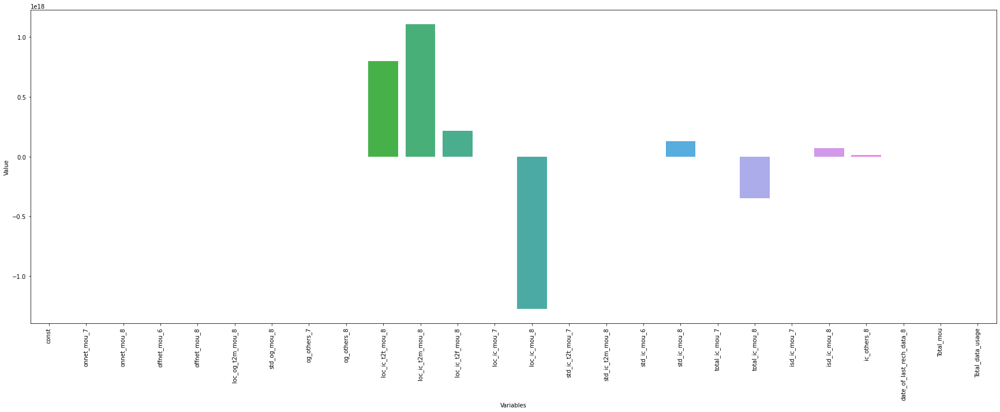

In [131]:
# plot the chart with top 25 important features

plt.figure(figsize=(30,10))
sns.barplot(x=var["Variables"],y=var["Value"])
plt.xticks(rotation=90)
plt.show()

# Conclusions

We are able to get 99% sensitivity and specificy with Random Forest Model. Hence, we would finalize this model and use it to predict the customters who would tend to churn out:

Test sensitivity : 0.9945205479452055
Test specificity : 0.9983042635658915

Below are the best features from the Random Forest model
* Total_mou
* Total_data_usage
* total_ic_mou_8
* total_og_mou_8
* arpu_8
* total_rech_amt_8
* loc_ic_mou_8
* arpu_diff
* loc_og_t2m_mou_8
* last_day_rch_amt_8
* date_of_last_rech_8
* loc_og_mou_8
* loc_ic_t2t_mou_8
* loc_ic_t2m_mou_8
* roam_ic_mou_8
* roam_og_mou_8
* total_og_mou_diff
* av_rech_amt_data_8
* max_rech_amt_8
* loc_ic_t2f_mou_8

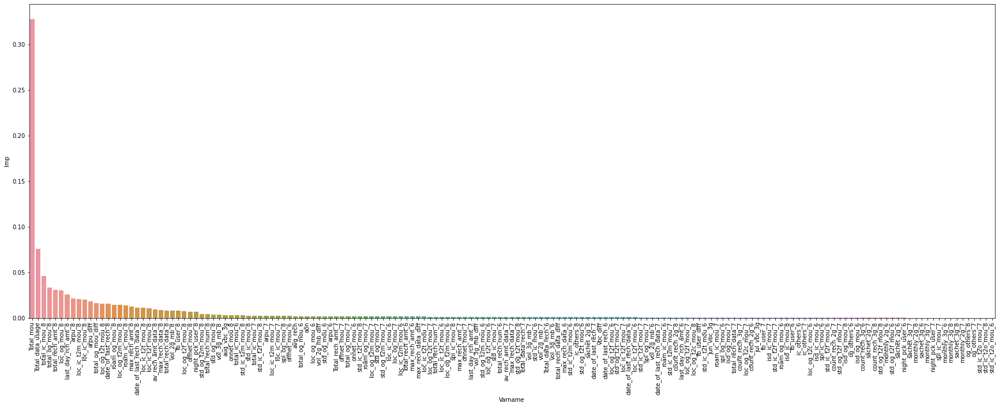

,Varname,Imp
150,Total_mou,0.328149
151,Total_data_usage,0.075699
83,total_ic_mou_8,0.045904
53,total_og_mou_8,0.033676
96,total_rech_amt_8,0.031051
29,loc_og_mou_8,0.030395
105,last_day_rch_amt_8,0.025580
2,arpu_8,0.021133
59,loc_ic_t2m_mou_8,0.020503
65,loc_ic_mou_8,0.020004


In [132]:
plt.figure(figsize=(30,10))
sns.barplot(x=df_rf.Varname,y=df_rf.Imp)
plt.xticks(rotation=90)
plt.show()
df_rf.iloc[0:20]

Based on the above important variables, we would like to suggest below business recommendations:

* Provide customers with competitive call rates.
* Introduce attractive and competitive data plans to the clients. Possibly, providing them add-on subscriptions of OTT platforms when choosing quarterly/yearly data plans.
* Suggest users to have more flexible rechage plans and give cashback on recharge packs . If possible, allow them to customize the monthly recharge plans. Give them bonus recharge offers on completing 2/3 years with the network.
* Maybe introduce Loyalty points system or give bonus vouchers whenever customers generate decent revenue through out the year.
* Roaming rates and services could be imporoved too.